# Analysis of predictions on yellow fever simulated reads

**Using the report files saved locally in `data/ncbi/infer_results/yf-ncbi/local-inf`**

Oct 1, 2024

After review previous analysis on Sep 30, 2024.

Ideas to develop:
- want to use a resolution of one BP for the position analysis. but this leads to gaps and too few samples per bin. need to simulate more reads and start the process again.
- analyze "mismatch/mutation" threshold level for each position that gives a poor accuracy
- use YF training subset to analyze the mutation/mismatch threshold level for 50-mers and relation to accuracy. use concept of coverage, nbr mutations, ...
- we see 4 clusters in the square plots, analyse the clusters evolutions for positions

List of future analysis at each step of the pipeline:
- create at least 3 to 5 times more reads to cover all positions
- rerun the prediction with scores
- rerun the analysis pipeline with bins of 1 bp

# 1. Imports and setup environment

In [ ]:
# Install required custom packages if not installed yet.
import importlib.util
if not importlib.util.find_spec('ecutilities'):
    print('installing package: `ecutilities`')
    ! pip install -qqU ecutilities
else:
    print('`ecutilities` already installed')
if not importlib.util.find_spec('metagentools'):
    print('installing package: `metagentools')
    ! pip install -qqU metagentools
else:
    print('`metagentools` already installed')

`ecutilities` already installed
`metagentools` already installed


In [ ]:
# Import all required packages
import json
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import re
import seaborn as sns
import time

from datetime import datetime
from ecutilities.core import files_in_tree
from ecutilities.ipython import nb_setup
from functools import partial
from IPython.display import display, update_display, Markdown, HTML
from matplotlib.gridspec import GridSpec
from nbdev import show_doc
from pandas import HDFStore
from pathlib import Path
from pprint import pprint
from tqdm.notebook import tqdm, trange
from typing import List, Tuple, Dict, Any, Generator

# Setup the notebook for development
nb_setup()

from metagentools.cnn_virus.data import FastaFileReader, FastqFileReader, AlnFileReader, TextFileBaseReader
from metagentools.cnn_virus.data import OriginalLabels
from metagentools.core import ProjectFileSystem

Set autoreload mode


# 2. Setup paths to files

### Key folders and system information

In [ ]:
pfs = ProjectFileSystem()
pfs.info()

Running linux on local computer
Device's home directory: /home/vtec
Project file structure:
 - Root ........ /home/vtec/projects/bio/metagentools 
 - Data Dir .... /home/vtec/projects/bio/metagentools/data 
 - Notebooks ... /home/vtec/projects/bio/metagentools/nbs


### Selected reference YF sequences

Load **selected reference sequences**, i.e. YF reference sequences from NCBI, which are also in the envelop percentage distance matrix.

- remove the following accessions, which have too many unknown bases: OM066735 and OM066736
- add a column with a sequence information

In [ ]:
p2list_refseqs = pfs.data/'ncbi/other/yf/YF_2023-accessions-in-ds-and-distance-matrix.csv'
assert p2list_refseqs.exists()

df_refseqs = pd.read_csv(p2list_refseqs, index_col=0)

# remove OM066735 and OM066736
idxs2drop = df_refseqs.loc[df_refseqs['refseq_accession'].str.contains(r'OM06673[56]', regex=True), :].index
df_refseqs = df_refseqs.drop(index=idxs2drop)
df_refseqs['info'] = df_refseqs.loc[:, ['refseq_accession', 'organism']].apply(lambda x: f'{x[0]}: {x[1]}', axis=1)
display(df_refseqs.head(5))

selected_refseqs = df_refseqs.index.to_list()
assert df_refseqs.shape[0] == len(selected_refseqs)
selected_refseqs[:3]

,refseq_accession,organism,info
refseqid,,,
11089:ncbi:1,AY968064,Angola_1971,AY968064: Angola_1971
11089:ncbi:2,U54798,Ivory_Coast_1982,U54798: Ivory_Coast_1982
11089:ncbi:4,AY572535,Gambia_2001,AY572535: Gambia_2001
11089:ncbi:6,U21056,Senegal_1927,U21056: Senegal_1927
11089:ncbi:7,AY968065,Uganda_1948,AY968065: Uganda_1948


['11089:ncbi:1', '11089:ncbi:2', '11089:ncbi:4']

### All inference reports

In [ ]:
p2report_dir = pfs.data/'ncbi/infer_results/yf-ncbi/local-inf'
assert p2report_dir.is_dir()
report_files = sorted([p for p in p2report_dir.glob('*.csv') if not p.stem.endswith('original')])
report_files[:3]

[Path('/home/vtec/projects/bio/metagentools/data/ncbi/infer_results/yf-ncbi/local-inf/11089_ncbi_1.csv'),
 Path('/home/vtec/projects/bio/metagentools/data/ncbi/infer_results/yf-ncbi/local-inf/11089_ncbi_10.csv'),
 Path('/home/vtec/projects/bio/metagentools/data/ncbi/infer_results/yf-ncbi/local-inf/11089_ncbi_12.csv')]

Load all reports into a dictionary, into one dataframe, after adding the accuracy column

In [ ]:
df = pd.DataFrame()

for p in report_files:
    df_p = pd.read_csv(p, index_col=0)
    df_p['accuracy'] = df_p['lbl_pred'] == df_p['lbl_true']
    df = df_p if df.empty else pd.concat([df, df_p])

report_cols = ['refseqid','accuracy','lbl_true','lbl_pred','pos_true','pos_pred','preds_score', 'probs_score',
               'top_5_lbl_pred_0','top_5_lbl_pred_1', 'top_5_lbl_pred_2', 'top_5_lbl_pred_3','top_5_lbl_pred_4']

df = df.loc[:, report_cols]
print(f"{df.shape[0]:,d} predictions; average {df.shape[0]//df_refseqs.shape[0]:,d} preds for each of the {len(df_refseqs)} reference sequences")
df.sample(3)

769,981 predictions; average 17,499 preds for each of the 44 reference sequences


,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4
readid,,,,,,,,,,,,,
11089:ncbi:31-15021,11089:ncbi:31,False,118,62,4781,7,0.453403,0.150652,118,62,32,19,102
11089:ncbi:21-2362,11089:ncbi:21,True,118,118,1839,7,1.600222,0.522005,118,169,62,121,172
11089:ncbi:58-8448,11089:ncbi:58,True,118,118,2887,2,0.801036,0.256613,118,143,103,32,10


Drop all reads that include a gap `-` in the read sequence.

In [ ]:
p2reads_with_gap = pfs.data/'ncbi/simreads/yf/single_69seq_150bp/reads_with_gap.csv'
assert p2reads_with_gap.exists()

reads_with_gap = pd.read_csv(p2reads_with_gap)
readids_with_gap = reads_with_gap.iloc[:,0].str.replace('@','').str.strip().to_list()
readids_with_gap[:3]

['11089:ncbi:1-16635', '11089:ncbi:1-16386', '11089:ncbi:1-16361']

In [ ]:
# # Check that all readids with gap are dropped from in the dataframe
# for idx, row in df.drop(index=pd.Index(readids_with_gap), errors='ignore', inplace=False).iterrows():
#     if idx in readids_with_gap:
#         print(idx, row)
#     if int(idx.split('-')[1])%10000 == 0:
#         print(idx)

Drop all the reads with a gap, as listed in `readids_with_gaps`.

In [ ]:
df = df.drop(index=pd.Index(readids_with_gap), errors='ignore', inplace=False)

# Inference Results Analysis

> **Important Note on metrics**: The accuracy is calculated as the percentage of the simulated reads that were correctly classified. This is calculated as the number of reads classified as the correct reference sequence divided by the total number of reads simulated for that reference sequence.
>
> In effect, we have a binary classification problem here because all the simulated reads are generated from Yellow Fever. In addition, predictions can only be either True Positive or False Negative. There cannot be True Negatives or False Positive. 
>
> Consequently, **Accuracy** = **Recall**. And we ca cannot evaluate Precision.
>
> Therefore, the entire analysis below focuses on the **Accuracy** = **Recall** metric.

## Accuracy per reference sequence

We add a column to our `df_refseq` dataframe with the mean accuracy for each reference sequence.

In [ ]:
df_refseqs['mean acc'] = df.groupby('refseqid')['accuracy'].mean()
df_refseqs

,refseq_accession,organism,info,mean acc
refseqid,,,,
11089:ncbi:1,AY968064,Angola_1971,AY968064: Angola_1971,0.168139
11089:ncbi:2,U54798,Ivory_Coast_1982,U54798: Ivory_Coast_1982,0.874933
11089:ncbi:4,AY572535,Gambia_2001,AY572535: Gambia_2001,0.995939
11089:ncbi:6,U21056,Senegal_1927,U21056: Senegal_1927,1.000000
11089:ncbi:7,AY968065,Uganda_1948,AY968065: Uganda_1948,0.192064
11089:ncbi:10,GQ379163,Peru_Hsapiens_2007,GQ379163: Peru_Hsapiens_2007,1.000000
11089:ncbi:12,MF289572,Singapore_2017,MF289572: Singapore_2017,1.000000
11089:ncbi:13,KU978764,Sudan_Hsapiens_1941,KU978764: Sudan_Hsapiens_1941,1.000000
11089:ncbi:14,JX898878,ArD181250_Senegal_2005,JX898878: ArD181250_Senegal_2005,0.997609


Bar plot of these accuracies, with `info` as the label for readibility.

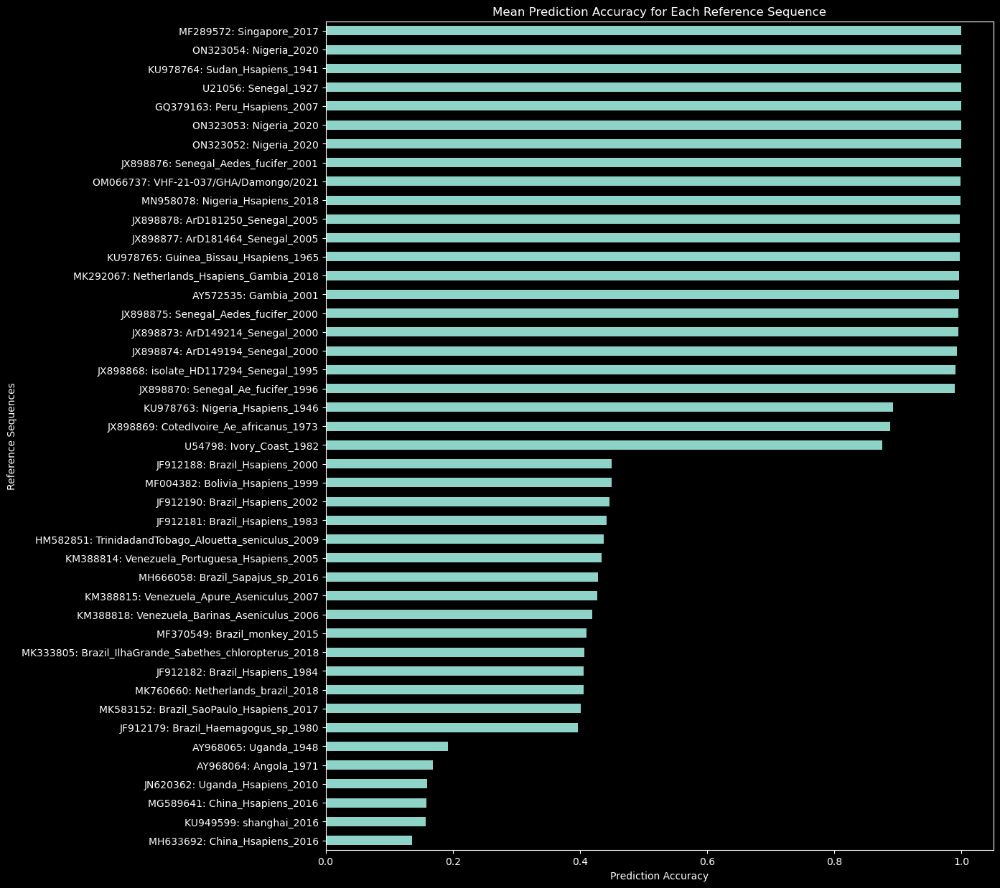

In [ ]:
to_plot = df_refseqs.copy()
to_plot.index = pd.Index(to_plot['info'])
fig, ax = plt.subplots(figsize=(12, 15))
to_plot.sort_values(by='mean acc')['mean acc'].plot(ax=ax,kind='barh', x='mean acc')
ax.set_title('Mean Prediction Accuracy for Each Reference Sequence');
ax.set_xlabel('Prediction Accuracy');
ax.set_ylabel('Reference Sequences');

> Note: all reference sequence have the same lenght, that is 10,237 bp

In [ ]:
refseq_length = 10_237

## Impact of Distance on Accuracy

Load the YF variants enveloppe percentage **distance matrix**

In [ ]:
p2distances = pfs.data / 'ncbi/other/yf/YF_2023_envelop_percentage_distance_matrix.csv'
dist_mx = pd.read_csv(p2distances, index_col=0)
for col in dist_mx.columns:
    dist_mx[col] = dist_mx[col].str.rstrip('%').astype(float)/100
dist_mx

,YFV_Cameroon_2023,YFV_CAR_2019,U21056_senegal_1927,JX898870_senegal_1996,U23574_Senegal_1965,JX898868_Senegal_1995,JX898873_ArD149214_Senegal_2000,JX898874_ArD149194_Senegal_2000,JX898875_Senegal_2000,JX898876_Senegal_2001,...,MH666058_Brazil_2016,MF370547_Brazil_2017,MK583152_Brazil_SaoPaulo_2017,KY885001_Brazil_2017,MW308134_Brazil_2018,MK760660_Netherlands_2018,MK333805_Brazil_IlhaGrande_2018,MW308135_Brazil_2019,MZ604867_Brazil_2019,MZ712143_Brazil_2021
,,,,,,,,,,,,,,,,,,,,,
YFV_Cameroon_2023,0.00,0.04,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19,...,0.19,0.18,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19
YFV_CAR_2019,0.04,0.00,0.19,0.18,0.18,0.18,0.18,0.18,0.18,0.18,...,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19
U21056_senegal_1927,0.19,0.19,0.00,0.04,0.04,0.04,0.05,0.05,0.05,0.04,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
JX898870_senegal_1996,0.19,0.18,0.04,0.00,0.03,0.00,0.03,0.03,0.03,0.03,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
U23574_Senegal_1965,0.19,0.18,0.04,0.03,0.00,0.03,0.04,0.04,0.04,0.03,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MK760660_Netherlands_2018,0.19,0.19,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
MK333805_Brazil_IlhaGrande_2018,0.19,0.19,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
MW308135_Brazil_2019,0.19,0.19,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


We need to map the index/column in the distance matrix to the reference sequence accession.
- extract the accession and other metadata from the distance matrix column names (`distance_accessions`)
- compare accessions in the matrix and those in the our selected reference sequence list
- create `refseqid2index`, a map (dict) between `refseqid`'s and distance matric index/column names

In [ ]:
distance_accessions = {}
missing=[]
for col in dist_mx.columns:
    regex = re.compile(r'^(?P<accession>\w{1,2}\d*)_(?P<country>.*)_(?P<year>\d\d\d\d)$')
    match = regex.search(col)
    if match: 
        accession = match.group('accession')
        subdict = {
            'accession': accession, 
            'country': match.group('country'), 
            'year': match.group('year'),
            'definition line': col
            } 
        distance_accessions[accession] = subdict
    else:
        missing =+ 1
        print(col, 'could not find the accession')

distance_accessions['U21056']

YFV_Cameroon_2023 could not find the accession
YFV_CAR_2019 could not find the accession
Yellow_fever_YF118_CAR_2018 could not find the accession


{'accession': 'U21056',
 'country': 'senegal',
 'year': '1927',
 'definition line': 'U21056_senegal_1927'}

In [ ]:
fa = FastaFileReader(pfs.data/'ncbi/refsequences/yf/yf_2023_yellow_fever.fa')
aln = AlnFileReader(pfs.data/'ncbi/simreads/yf/single_69seq_150bp/single_69seq_150bp.aln')
refseq_metadata = aln.parse_header_reference_sequences()

In [ ]:
for i, refseqid in enumerate(df_refseqs.index):
    accession = df_refseqs.loc[refseqid, 'refseq_accession']
    print(f"{i+1:2d}. {accession:10s} {refseqid:15s} {distance_accessions.get(accession, 'not found')['definition line']}")

 1. AY968064   11089:ncbi:1    AY968064_angola_1971
 2. U54798     11089:ncbi:2    U54798_Ivory_Coast_1982
 3. AY572535   11089:ncbi:4    AY572535_Gambia_2001
 4. U21056     11089:ncbi:6    U21056_senegal_1927
 5. AY968065   11089:ncbi:7    AY968065_Uganda_1948
 6. GQ379163   11089:ncbi:10   GQ379163_Peru_2007
 7. MF289572   11089:ncbi:12   MF289572_Singapore_2017
 8. KU978764   11089:ncbi:13   KU978764_Sudan_1941
 9. JX898878   11089:ncbi:14   JX898878_ArD181250_Senegal_2005
10. JX898877   11089:ncbi:18   JX898877_ArD181464_Senegal_2005
11. JX898876   11089:ncbi:19   JX898876_Senegal_2001
12. KU978765   11089:ncbi:20   KU978765_GuineaBissau_1965
13. JX898870   11089:ncbi:21   JX898870_senegal_1996
14. JX898868   11089:ncbi:22   JX898868_Senegal_1995
15. JX898875   11089:ncbi:23   JX898875_Senegal_2000
16. JX898874   11089:ncbi:24   JX898874_ArD149194_Senegal_2000
17. JX898873   11089:ncbi:25   JX898873_ArD149214_Senegal_2000
18. MK292067   11089:ncbi:26   MK292067_Netherlands_2018
19.

In [ ]:
refseqid2index = {refseqid:distance_accessions[accession]['definition line'] for refseqid,accession in zip(df_refseqs.index, df_refseqs.refseq_accession)}
refseqid2index['11089:ncbi:10']

'GQ379163_Peru_2007'

Now we can create a new distance matrix whose index/column names only include the selected references

In [ ]:
dist_mx = dist_mx.loc[refseqid2index.values(), refseqid2index.values()]
print(dist_mx.shape)
dist_mx.iloc[:5,:5]

(44, 44)


,AY968064_angola_1971,U54798_Ivory_Coast_1982,AY572535_Gambia_2001,U21056_senegal_1927,AY968065_Uganda_1948
,,,,,
AY968064_angola_1971,0.00,0.20,0.18,0.18,0.13
U54798_Ivory_Coast_1982,0.20,0.00,0.09,0.10,0.19
AY572535_Gambia_2001,0.18,0.09,0.00,0.05,0.18
U21056_senegal_1927,0.18,0.10,0.05,0.00,0.18
AY968065_Uganda_1948,0.13,0.19,0.18,0.18,0.00


### Pick a base variant from which to measure distances

Select the **basis sequence** for distance, as one of the sequence with perfect accuracy:

In [ ]:
df_refseqs.loc[df_refseqs['mean acc'] ==1.0, :]

,refseq_accession,organism,info,mean acc
refseqid,,,,
11089:ncbi:6,U21056,Senegal_1927,U21056: Senegal_1927,1.0
11089:ncbi:10,GQ379163,Peru_Hsapiens_2007,GQ379163: Peru_Hsapiens_2007,1.0
11089:ncbi:12,MF289572,Singapore_2017,MF289572: Singapore_2017,1.0
11089:ncbi:13,KU978764,Sudan_Hsapiens_1941,KU978764: Sudan_Hsapiens_1941,1.0
11089:ncbi:66,ON323054,Nigeria_2020,ON323054: Nigeria_2020,1.0


Pick `'11089:ncbi:6' U21056	Senegal_1927`, as it the the oldest one with 100% accuracy

In [ ]:
basis_sequence = '11089:ncbi:6'

Create a distances `Series`: one dimension array of distance from basis sequence to each of the other sequences

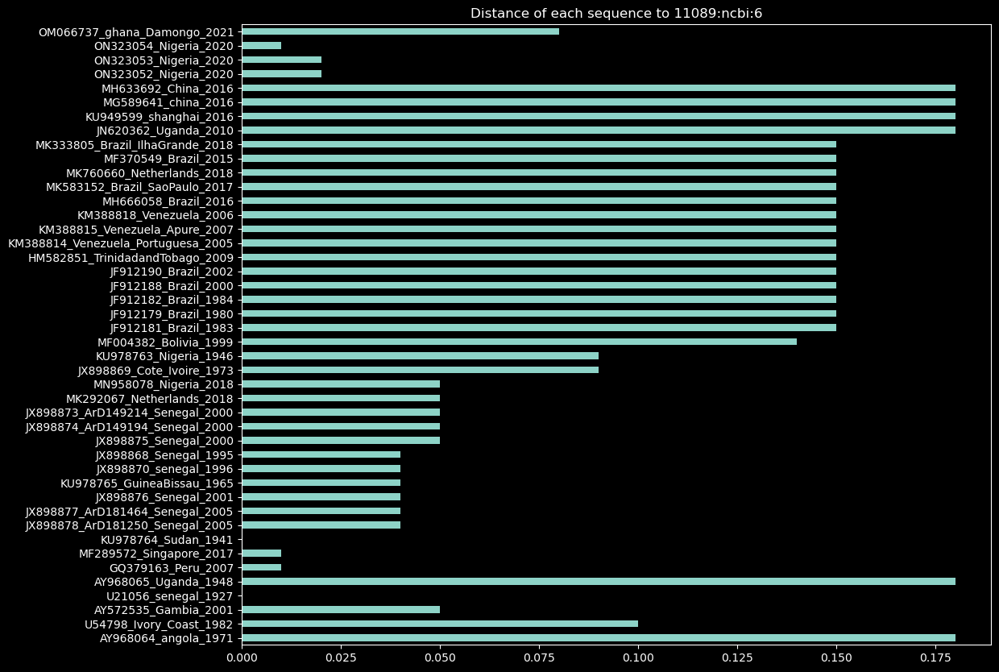

In [ ]:
distances = dist_mx.loc[refseqid2index[basis_sequence], :]
distances.plot(kind='barh', figsize=(12, 10), title=f'Distance of each sequence to {basis_sequence}');

Create a set of index lists to sort both `df_refseq` and `distances` in the same order, i.e. decreasing order of accuracy. Then reorder the `df_refseqs` and `distances` dataframe

In [ ]:
ordered_accuracies = df_refseqs.sort_values('mean acc', ascending=False)
ordered_index = ordered_accuracies.index
print('df_refseqs by decreasing accuracies:')
display(ordered_accuracies.head(3))

ordered_distance_index = list(map(refseqid2index.get, ordered_index))
ordered_distances = distances.loc[ordered_distance_index]
print('distances ordered by decreasing accuracies of the reference sequence:')
display(ordered_distances[:3])

# Add distances to the df_refseqs
df_refseqs.loc[ordered_index, 'distance'] = ordered_distances.values
print('df_refseqs with distance columns, ordered by decreasing accuracies:')
display(df_refseqs.loc[ordered_index].head(3))
print('df_refseqs with distance columns, ordered in normal order:')
display(df_refseqs.head(3))

distances = distances.loc[ordered_distance_index]
distances.head(3)

df_refseqs by decreasing accuracies:


,refseq_accession,organism,info,mean acc
refseqid,,,,
11089:ncbi:6,U21056,Senegal_1927,U21056: Senegal_1927,1.0
11089:ncbi:66,ON323054,Nigeria_2020,ON323054: Nigeria_2020,1.0
11089:ncbi:10,GQ379163,Peru_Hsapiens_2007,GQ379163: Peru_Hsapiens_2007,1.0


distances ordered by decreasing accuracies of the reference sequence:


U21056_senegal_1927      0.00
ON323054_Nigeria_2020    0.01
GQ379163_Peru_2007       0.01
Name: U21056_senegal_1927, dtype: float64

df_refseqs with distance columns, ordered by decreasing accuracies:


,refseq_accession,organism,info,mean acc,distance
refseqid,,,,,
11089:ncbi:6,U21056,Senegal_1927,U21056: Senegal_1927,1.0,0.00
11089:ncbi:66,ON323054,Nigeria_2020,ON323054: Nigeria_2020,1.0,0.01
11089:ncbi:10,GQ379163,Peru_Hsapiens_2007,GQ379163: Peru_Hsapiens_2007,1.0,0.01


df_refseqs with distance columns, ordered in normal order:


,refseq_accession,organism,info,mean acc,distance
refseqid,,,,,
11089:ncbi:1,AY968064,Angola_1971,AY968064: Angola_1971,0.168139,0.18
11089:ncbi:2,U54798,Ivory_Coast_1982,U54798: Ivory_Coast_1982,0.874933,0.10
11089:ncbi:4,AY572535,Gambia_2001,AY572535: Gambia_2001,0.995939,0.05


U21056_senegal_1927      0.00
ON323054_Nigeria_2020    0.01
GQ379163_Peru_2007       0.01
Name: U21056_senegal_1927, dtype: float64

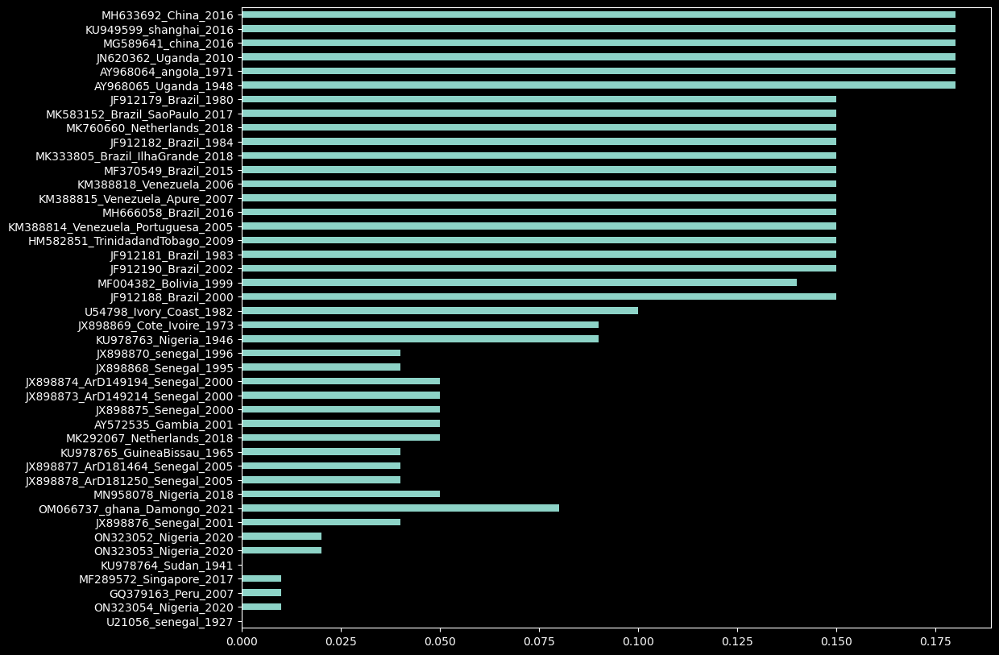

In [ ]:
distances.loc[ordered_distance_index].plot(kind='barh', figsize=(12, 10));

Plot the relationship between distance and accuracy for each reference sequence

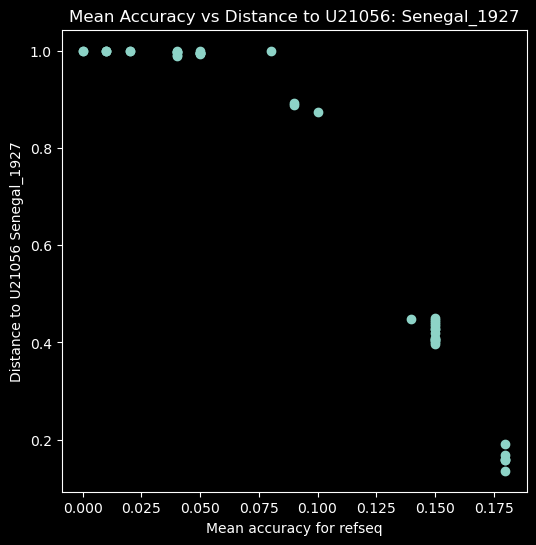

In [ ]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(x=df_refseqs['distance'], y=df_refseqs['mean acc'])
ax.set_title(f"Mean Accuracy vs Distance to U21056: Senegal_1927")
ax.set_xlabel('Mean accuracy for refseq')
ax.set_ylabel('Distance to U21056 Senegal_1927')
plt.show()

In [ ]:
correlations = df_refseqs.loc[:, ['mean acc', 'distance']].corr()
print(f"Correlation between mean accuracy and distance to U21056: Senegal_1927: {correlations.loc['mean acc', 'distance']:.1%}")

Correlation between mean accuracy and distance to U21056: Senegal_1927: -95.9%


Clear negative correlation between the mean accuracy and the distance between a sequence and U21056-Senegal_1927. (-96.0%)

## Impact of Read Position on Accuracy

We will bin the position in bins of 3 bps

In [ ]:
nb_bins = refseq_length // 3
print(f"Using {nb_bins:,d} position bins. Each bin includes {refseq_length//nb_bins} nucleotides")
# df['bin'], pos_bins = df['pos_true'], df['pos_true']
df['bin'], pos_bins = pd.cut(df['pos_true'], bins=nb_bins, labels=range(0,nb_bins), retbins=True)
nb_reads_per_position = df.groupby(by='bin')['bin'].count().mean()
print(f"Average of {int(nb_reads_per_position):,d} reads per position bin")
df.head(3)

Using 3,412 position bins. Each bin includes 3 nucleotides
Average of 222 reads per position bin


,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4,bin
readid,,,,,,,,,,,,,,
11089:ncbi:1-17000,11089:ncbi:1,False,118,10,7804,0,0.296598,0.122977,118,32,10,62,94,2640
11089:ncbi:1-16999,11089:ncbi:1,False,118,2,6069,4,-0.024773,0.003527,62,2,32,9,1,2053
11089:ncbi:1-16998,11089:ncbi:1,False,118,144,5317,4,0.090977,0.233104,144,146,62,118,143,1798


In [ ]:
fa.reset_iterator()
for o in fa:
    if len(o['sequence']) != refseq_length:
        print(f"Sequence {o['header']} has length {len(o['sequence'])}")

The true position is the position of the first BP in the simulated reads. As the reads are 150-mers reads in this datasets, we will not find any true position greater than 10,087.

In [ ]:
unique_positions = df['pos_true'].unique()
missing_pos = set(range(refseq_length)).difference(set(df['pos_true'].unique()))
print(f"Sequences have {refseq_length:,d} positions (from 0 to {refseq_length-1:,d})")
print(f"Simulated reads (150-mer) start at one of {len(unique_positions):,d} unique positions.")
print(f"The difference {refseq_length:,d} - {len(unique_positions):,d} = {refseq_length-len(unique_positions):,d} is due to the 150 bp lenghts of the reads")
print(f"The largest position in dataset is {max(unique_positions)} (from 0 to {max(unique_positions)})")
print(f"There are {len(missing_pos)} positions from {min(missing_pos)} to {max(missing_pos)} that are not possible in the reads")

Sequences have 10,237 positions (from 0 to 10,236)
Simulated reads (150-mer) start at one of 10,087 unique positions.
The difference 10,237 - 10,087 = 150 is due to the 150 bp lenghts of the reads
The largest position in dataset is 10086 (from 0 to 10086)
There are 150 positions from 10087 to 10236 that are not possible in the reads


In [ ]:
df.loc[df['refseqid'] == refseqid, :].bin.max()

3411

In [ ]:
def plot_accuracy_per_position(df: pd.DataFrame, refseqid:str, figsize=(15,3), ax=None):
    df_ = df.loc[df['refseqid'] == refseqid, :]
    nb_position_bins = df_.bin.max()
    info = df_refseqs.loc[refseqid,'info']
    accuracy = df_['accuracy'].mean()
    acc_per_bin = df_.groupby('bin')['accuracy'].mean()
    acc_reindexed = acc_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)
    missing_bins = pd.Series(index=acc_reindexed.index, data=1)
    missing_bins.loc[acc_reindexed.notna()] = np.nan

    if ax is None: 
        fig,ax = plt.subplots(figsize=figsize)
        show_this_axis = True
    else:
        show_this_axis = False

    bar_w = 1 
    colors = acc_reindexed.apply(lambda x: 'red' if x < 0.6 else 'green')

    acc_reindexed.plot(ax=ax, kind='bar', ylim=(0,1), width=bar_w, color=colors, legend=False)
    missing_bins.plot(ax=ax, kind='bar', ylim=(0,1), width=bar_w, color='blue', alpha=0.5, legend=False)
    ax.set_title(f"Mean accuracy per position: {info} (mean full sequence:{accuracy:.3f})")
    ax.hlines(y=accuracy, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax.set_ylabel('accuracy')
    ticks = range(0,nb_position_bins+1,500)
    ax.set_xticks(ticks, ticks)

    if show_this_axis: plt.show()

# plot_accuracy_per_position(df, '11089:ncbi:1',figsize=(15,2), ax=None)
# plot_accuracy_per_position(df, '11089:ncbi:6',figsize=(15,2), ax=None)

Plot accuracy for all reads starting at a specific position, for each reference sequence.

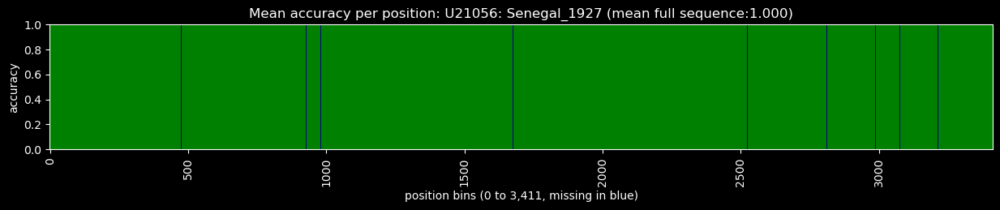

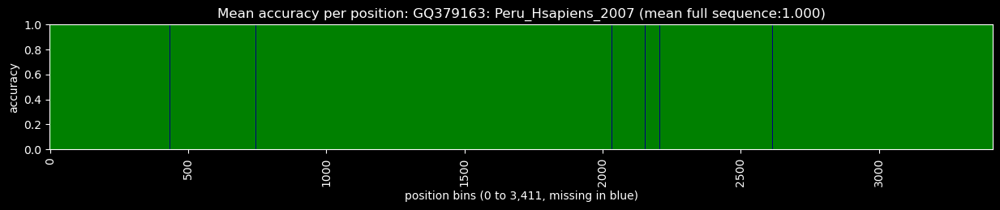

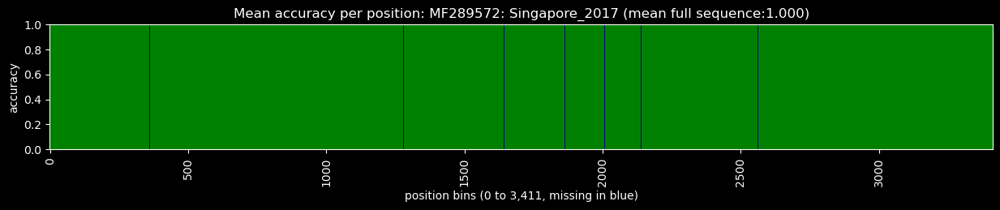

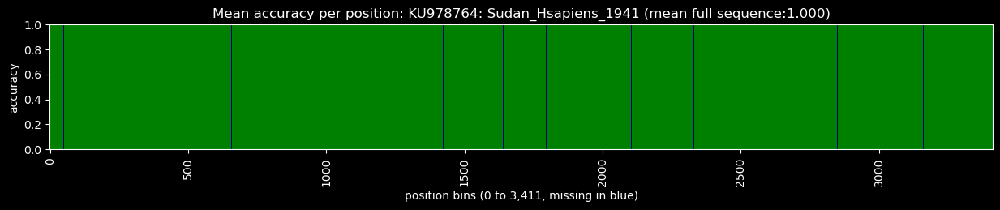

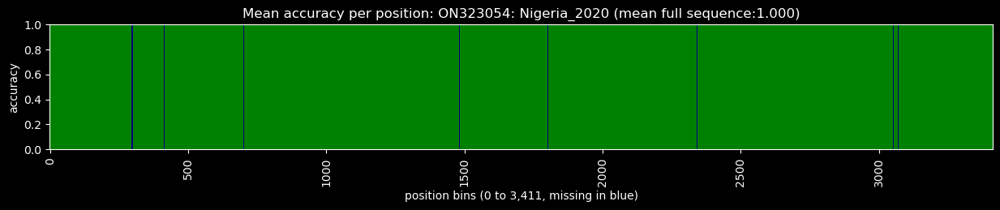

...

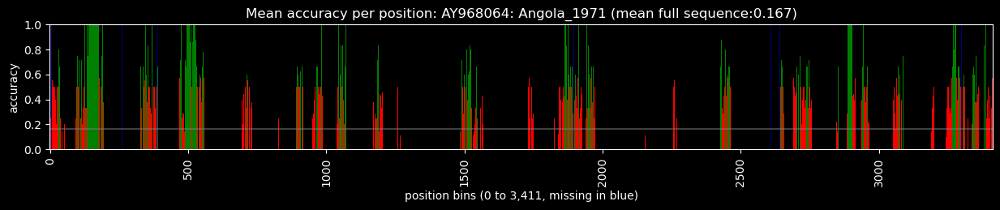

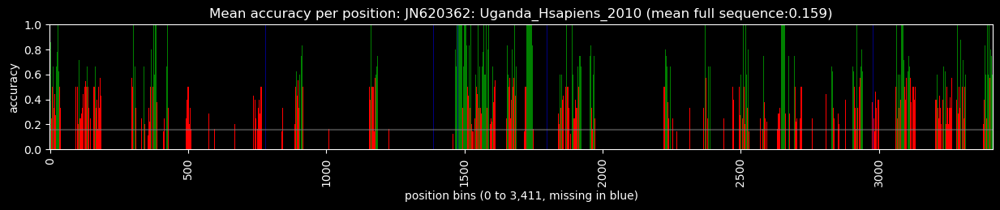

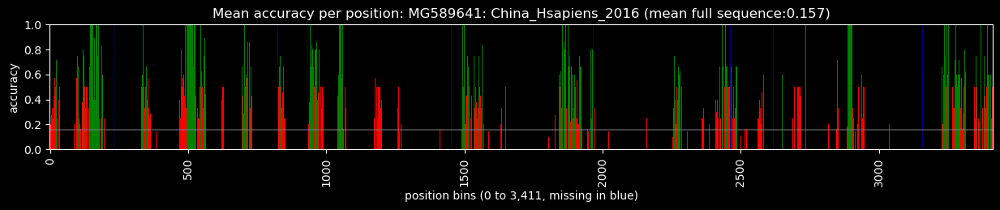

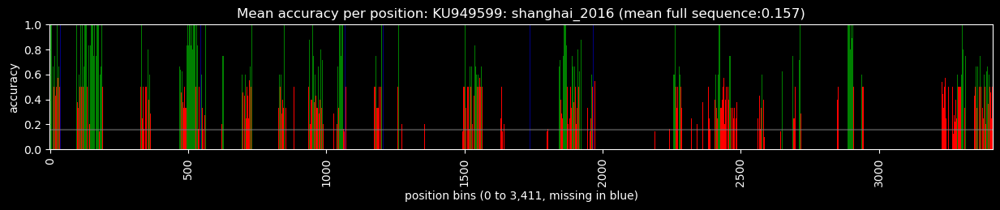

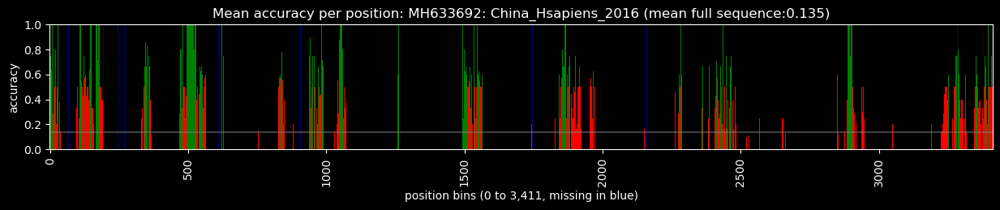

In [ ]:
for idx in ordered_index:
    plot_accuracy_per_position(df, idx, figsize=(15,2), ax=None)

## Analysis of Label Probabilities

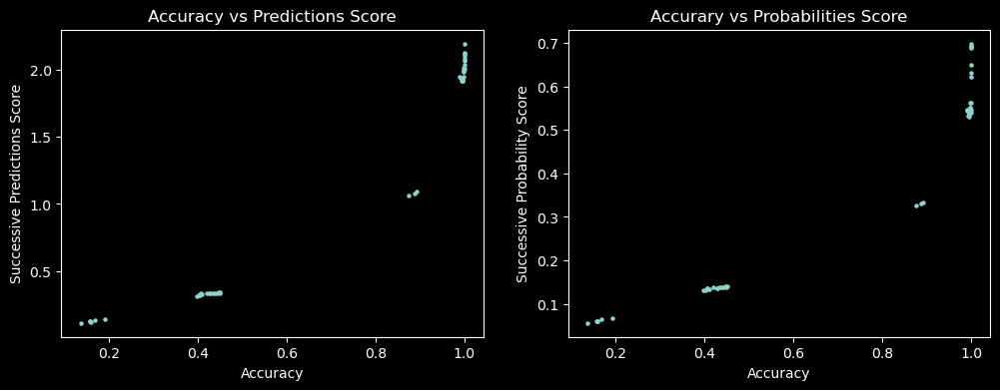

In [ ]:
coi = ['preds_score','probs_score','accuracy']
grouped = df.groupby(by='refseqid')[coi].mean().loc[ordered_index, :]
grouped.index = pd.Index(ordered_distance_index)

n = 4
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(3*n, n))
# ax1.scatter(x=grouped['accuracy'], y=np.log(grouped['preds_score']), s=5)
ax1.scatter(x=grouped['accuracy'], y=grouped['preds_score'], s=5)
ax1.set_title('Accuracy vs Predictions Score')
ax1.set_xlabel('Accuracy')
# ax1.set_ylabel('Successive Predictions Score (log)')
ax1.set_ylabel('Successive Predictions Score')
# ax2.scatter(x=grouped['accuracy'], y=np.log(grouped['probs_score']),s=5)
ax2.scatter(x=grouped['accuracy'], y=grouped['probs_score'],s=5)
ax2.set_title('Accurary vs Probabilities Score');
ax2.set_xlabel('Accuracy')
# ax2.set_ylabel('Successive Probability Score (log)');
ax2.set_ylabel('Successive Probability Score');

There are obvious clusters in these plots.

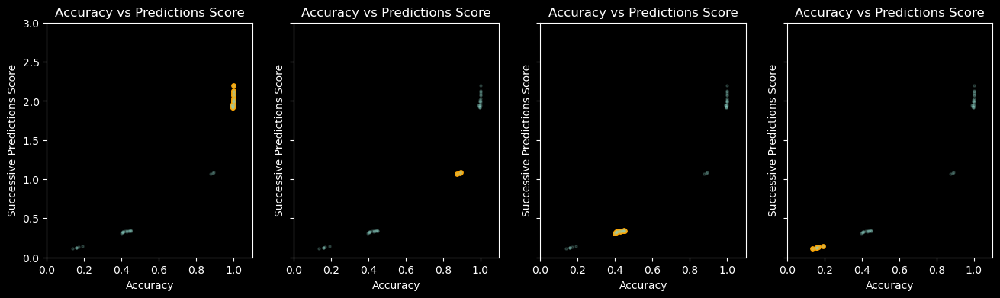

In [ ]:
def plot_cluster(ax, cluster, df: pd.DataFrame):
    ax.scatter(x=cluster['accuracy'], y=cluster['preds_score'], s=15, c='orange')
    ax.scatter(x=df['accuracy'], y=df['preds_score'], s=5, alpha=0.2)
    ax.set_title('Accuracy vs Predictions Score')
    ax.set_xlim((0,1.1))
    ax.set_ylim((0,3))
    ax.set_xlabel('Accuracy')
    ax.set_ylabel('Successive Predictions Score')

top_acc = grouped.loc[grouped.preds_score > 1.5, :].loc[grouped.accuracy > 0.8, :]
middle_high_acc = grouped.loc[grouped.preds_score < 1.5, :].loc[grouped.accuracy > 0.6, :]
middle_low_acc = grouped.loc[grouped.preds_score < 1, :].loc[grouped.accuracy > 0.3, :]
bottom_acc = grouped.loc[grouped.preds_score < 0.5, :].loc[grouped.accuracy < 0.3, :]

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(4*n, n), sharey=True)
for ax,dframe in zip(axs.flatten(), [top_acc, middle_high_acc, middle_low_acc, bottom_acc]):
    plot_cluster(ax, dframe, grouped)

plt.show()

In [ ]:
print(f"{'Cluster Top Accuracy:':<40s}{'Preds Score':^10s}{'Distance':^10s}{'Accuracy':^10s}")
for idx, row in top_acc.iterrows():
    print(f" - {idx:40s}  {row['preds_score']:.2f}       {distances.loc[idx]:.2f}    {row['accuracy']:.3f}")

Cluster Top Accuracy:                   Preds Score Distance  Accuracy 
 - U21056_senegal_1927                       2.10       0.00    1.000
 - ON323054_Nigeria_2020                     2.19       0.01    1.000
 - GQ379163_Peru_2007                        2.07       0.01    1.000
 - MF289572_Singapore_2017                   2.00       0.01    1.000
 - KU978764_Sudan_1941                       2.08       0.00    1.000
 - ON323053_Nigeria_2020                     2.12       0.02    1.000
 - ON323052_Nigeria_2020                     2.13       0.02    1.000
 - JX898876_Senegal_2001                     2.03       0.04    0.999
 - OM066737_ghana_Damongo_2021               1.98       0.08    0.999
 - MN958078_Nigeria_2018                     1.94       0.05    0.999
 - JX898878_ArD181250_Senegal_2005           1.99       0.04    0.998
 - JX898877_ArD181464_Senegal_2005           1.99       0.04    0.997
 - KU978765_GuineaBissau_1965                2.01       0.04    0.997
 - MK292067_Nether

In [ ]:
print(f"{'Cluster Middle High Accuracy:':<40s}{'Preds Score':^10s}{'Distance':^10s}{'Accuracy':^10s}")
for idx, row in middle_high_acc.iterrows():
    print(f" - {idx:40s}  {row['preds_score']:.2f}       {distances.loc[idx]:.2f}    {row['accuracy']:.3f}")

Cluster Middle High Accuracy:           Preds Score Distance  Accuracy 
 - KU978763_Nigeria_1946                     1.09       0.09    0.892
 - JX898869_Cote_Ivoire_1973                 1.08       0.09    0.888
 - U54798_Ivory_Coast_1982                   1.06       0.10    0.875


In [ ]:
print(f"{'Cluster Middle Low Accuracy:':<40s}{'Preds Score':^10s}{'Distance':^10s}{'Accuracy':^10s}")
for idx, row in middle_low_acc.iterrows():
    print(f" - {idx:40s}  {row['preds_score']:.2f}       {distances.loc[idx]:.2f}    {row['accuracy']:.3f}")

Cluster Middle Low Accuracy:            Preds Score Distance  Accuracy 
 - JF912188_Brazil_2000                      0.34       0.15    0.450
 - MF004382_Bolivia_1999                     0.34       0.14    0.449
 - JF912190_Brazil_2002                      0.35       0.15    0.447
 - JF912181_Brazil_1983                      0.33       0.15    0.442
 - HM582851_TrinidadandTobago_2009           0.34       0.15    0.438
 - KM388814_Venezuela_Portuguesa_2005        0.34       0.15    0.434
 - MH666058_Brazil_2016                      0.34       0.15    0.428
 - KM388815_Venezuela_Apure_2007             0.33       0.15    0.428
 - KM388818_Venezuela_2006                   0.34       0.15    0.420
 - MF370549_Brazil_2015                      0.33       0.15    0.410
 - MK333805_Brazil_IlhaGrande_2018           0.33       0.15    0.407
 - JF912182_Brazil_1984                      0.33       0.15    0.406
 - MK760660_Netherlands_2018                 0.32       0.15    0.405
 - MK583152_Brazil

In [ ]:
print(f"{'Cluster Bottom Accuracy:':<40s}{'Preds Score':^10s}{'Distance':^10s}{'Accuracy':^10s}")
for idx, row in bottom_acc.iterrows():
    print(f" - {idx:40s}  {row['preds_score']:.2f}       {distances.loc[idx]:.2f}    {row['accuracy']:.3f}")

Cluster Bottom Accuracy:                Preds Score Distance  Accuracy 
 - AY968065_Uganda_1948                      0.14       0.18    0.192
 - AY968064_angola_1971                      0.13       0.18    0.168
 - JN620362_Uganda_2010                      0.12       0.18    0.159
 - MG589641_china_2016                       0.13       0.18    0.158
 - KU949599_shanghai_2016                    0.12       0.18    0.158
 - MH633692_China_2016                       0.11       0.18    0.136


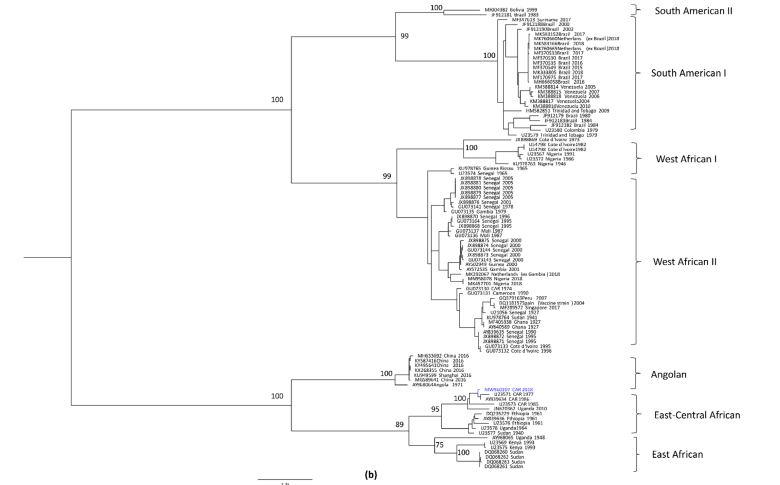

#### Probability Scores and Accuracy (mean value per sequence)

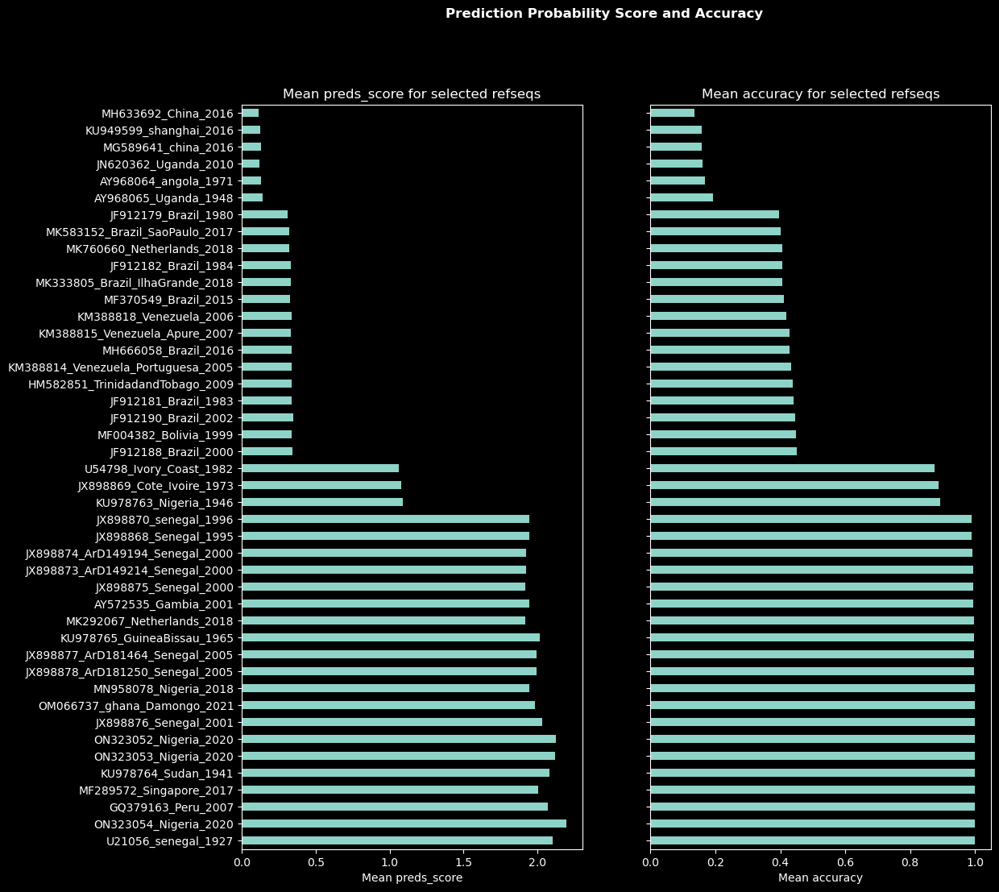

In [ ]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(12, 12), sharey=True)
fig.suptitle('Prediction Probability Score and Accuracy', fontweight='bold')
grouped.preds_score.plot(ax=ax1, kind='barh', title='Mean preds_score for selected refseqs');
ax1.set_xlabel('Mean preds_score')

grouped.accuracy.plot(ax=ax2, kind='barh',  title='Mean accuracy for selected refseqs');
ax2.set_xlabel('Mean accuracy');

In [ ]:
print(f"Correlation between prediction score and accuracy: {grouped.loc[:, ['preds_score', 'accuracy']].corr().iloc[0,0]}")

Correlation between prediction score and accuracy: 1.0


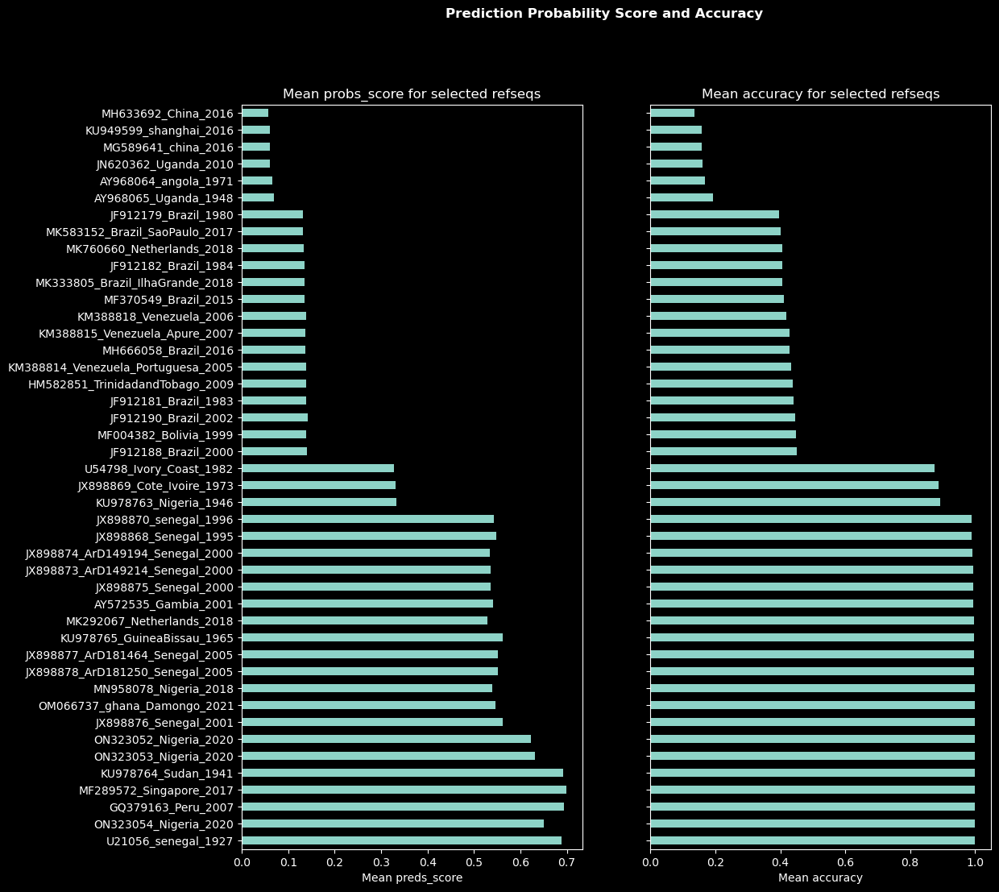

In [ ]:
fig,(ax1,ax2) = plt.subplots(nrows=1,ncols=2,figsize=(12, 12), sharey=True)
fig.suptitle('Prediction Probability Score and Accuracy', fontweight='bold')
grouped.probs_score.plot(ax=ax1, kind='barh', title='Mean probs_score for selected refseqs');
ax1.set_xlabel('Mean preds_score')

grouped.accuracy.plot(ax=ax2, kind='barh',  title='Mean accuracy for selected refseqs');
ax2.set_xlabel('Mean accuracy');

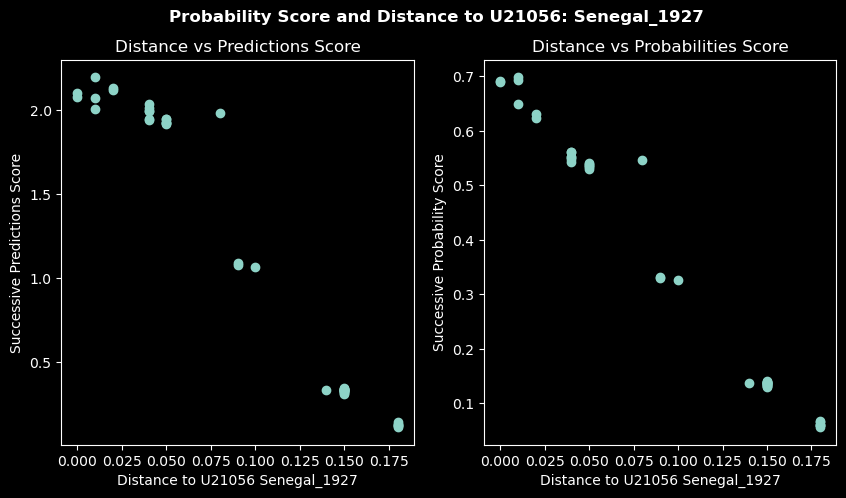

In [ ]:
n = 5
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(2 * n, n))
fig.suptitle('Probability Score and Distance to U21056: Senegal_1927', fontweight='bold')

ax1.scatter(x=distances.loc[ordered_distance_index], y=grouped['preds_score']);
ax1.set_title('Distance vs Predictions Score')
ax1.set_xlabel('Distance to U21056 Senegal_1927')
ax1.set_ylabel('Successive Predictions Score')

ax2.scatter(x=distances.loc[ordered_distance_index], y=grouped['probs_score']);
ax2.set_title('Distance vs Probabilities Score')
ax2.set_xlabel('Distance to U21056 Senegal_1927')
ax2.set_ylabel('Successive Probability Score');

## Probability per position

In [ ]:
def plot_analysis_per_position(df: pd.DataFrame, refseqid:str, metric='preds_score', figsize=(15,2*2+1)):
    df_ = df.loc[df['refseqid'] == refseqid, :]
    nb_position_bins = df_.bin.max()
    info = df_refseqs.loc[refseqid,'info']
    accuracy = df_['accuracy'].mean()
    acc_per_bin = df_.groupby('bin')['accuracy'].mean()
    acc_reindexed = acc_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)
    missing_bins = pd.Series(index=acc_reindexed.index, data=1)
    missing_bins.loc[acc_reindexed.notna()] = np.nan
    score = df_[metric].mean()
    score_per_bin = df_.groupby('bin')[metric].mean()
    score_reindexed = score_per_bin.reindex(range(nb_position_bins+1), fill_value=np.nan)

    fig,(ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=figsize, sharex=True)
    fig.suptitle(f"Per Position Analysis for {info}", fontsize=16,fontweight='bold')

    # Plot Accuracy
    acc_threshold = 0.6
    bar_w = 1 
    colors_acc = acc_reindexed.apply(lambda acc: 'green' if acc > acc_threshold else 'red')

    acc_reindexed.plot(ax=ax1, kind='bar', ylim=(0,1), width=bar_w, color=colors_acc, legend=False)
    missing_bins.plot(ax=ax1, kind='bar', ylim=(0,1), width=bar_w, color='blue', alpha=0.5, legend=False)
    ax1.set_title(f"Accuracy per position bin (full sequence:{accuracy:.3f})",fontweight='bold')
    ax1.hlines(y=accuracy, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax1.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax1.set_ylabel('accuracy')
    ticks = range(0,nb_position_bins+1,500)
    ax1.set_xticks(ticks, ticks)

    # Plot scores 
    if metric == 'preds_score':
        score_threshold = 1.5
        ylim = (0,5)
    elif metric == 'probs_score':
        score_threshold = 0.4
        ylim = (0,1)
    else:
        score_threshold = 0.0
        ylim = (0,5)

    def color_score(row):
        acc, score = row
        if acc >= acc_threshold: high_acc = True
        else: high_acc = False
        if score >= score_threshold: high_score = True
        else: high_score = False
        color = 'green' if high_acc and high_score else 'red' if not high_acc else 'yellow'
        return color
    
    colors_score = pd.concat([acc_reindexed, score_reindexed], axis=1).apply(color_score, axis=1)
    score_reindexed.plot(ax=ax2, kind='bar', ylim=ylim, width=bar_w, color=colors_score, legend=False)
    missing_bins.plot(ax=ax2, kind='bar', ylim=(0,1), width=bar_w, color='blue', alpha=0.5, legend=False)
    ax2.set_title(f"{metric} per position bin (full sequence:{score:.3f})",fontweight='bold')
    ax2.hlines(y=score, xmin=0, xmax=nb_position_bins, color='gray', linestyles='solid', alpha=0.5)
    ax2.set_xlabel(f"position bins (0 to {nb_position_bins:,d}, missing in blue)")
    ax2.set_ylabel(metric)
    ax2.set_xticks(ticks, ticks)

    plt.subplots_adjust(hspace=.25)
    plt.show()

# plot_analysis_per_position(df, '11089:ncbi:1')
# plot_analysis_per_position(df, '11089:ncbi:6')
# plot_analysis_per_position(df, '11089:ncbi:37')

##### Plot probability score per position

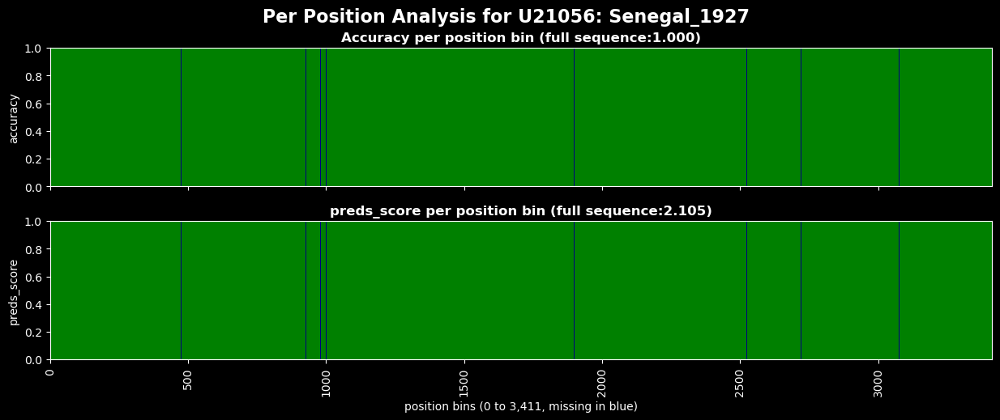

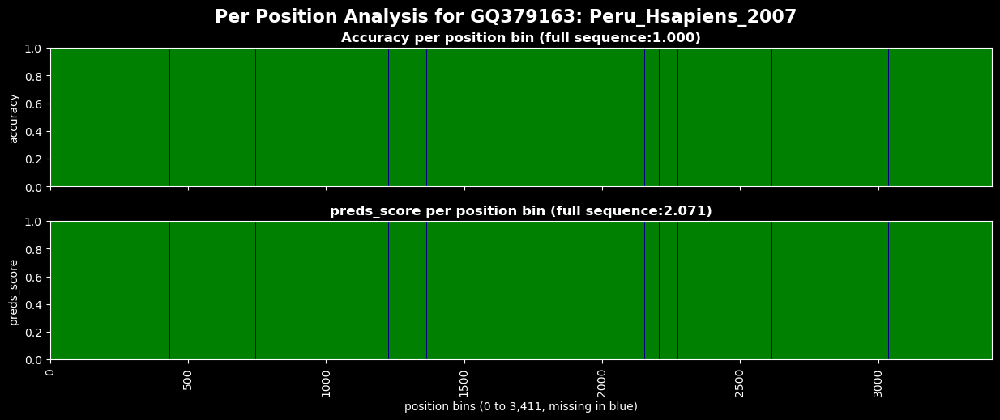

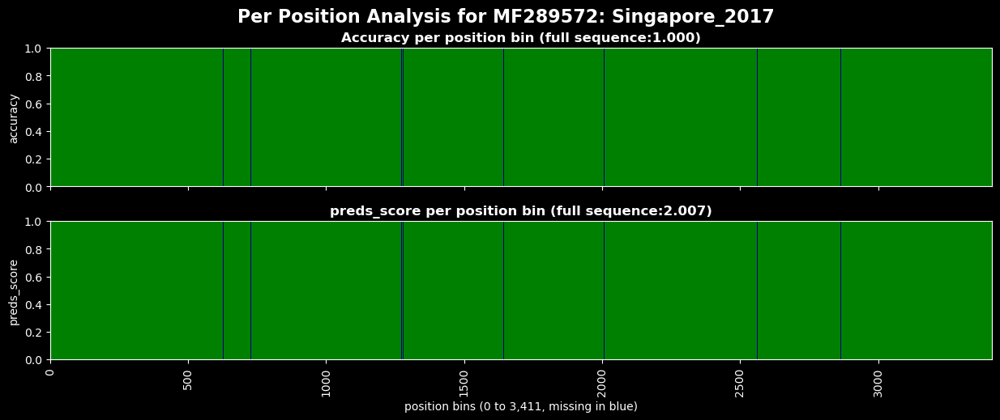

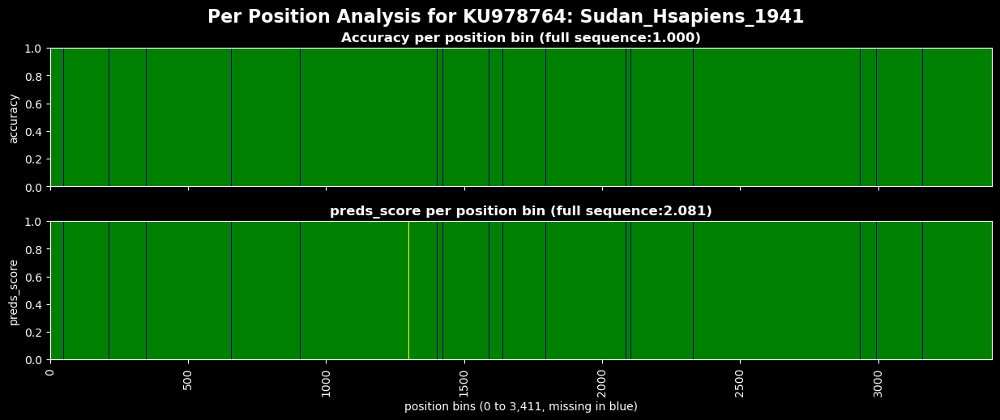

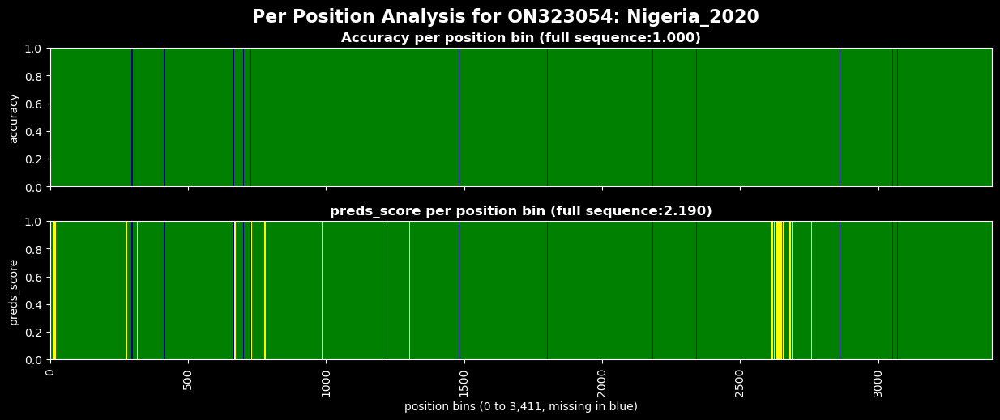

...

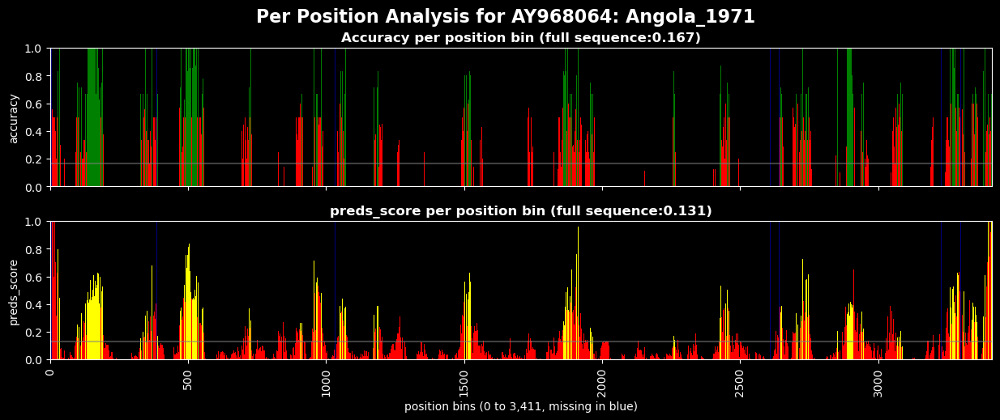

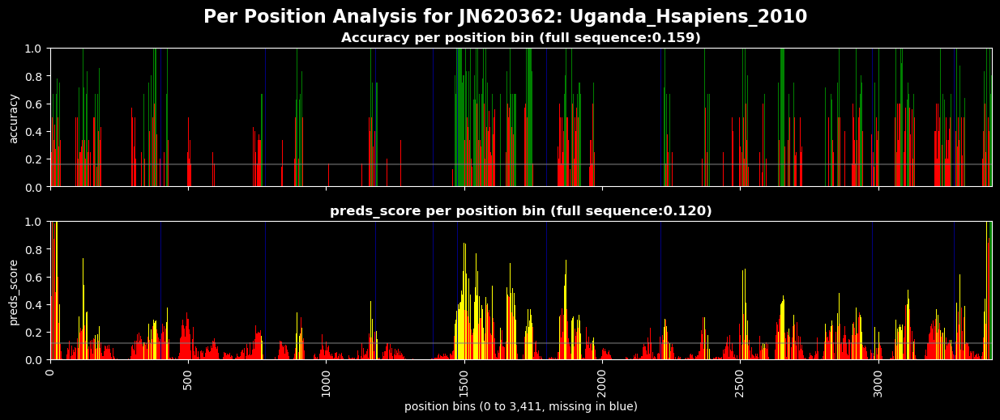

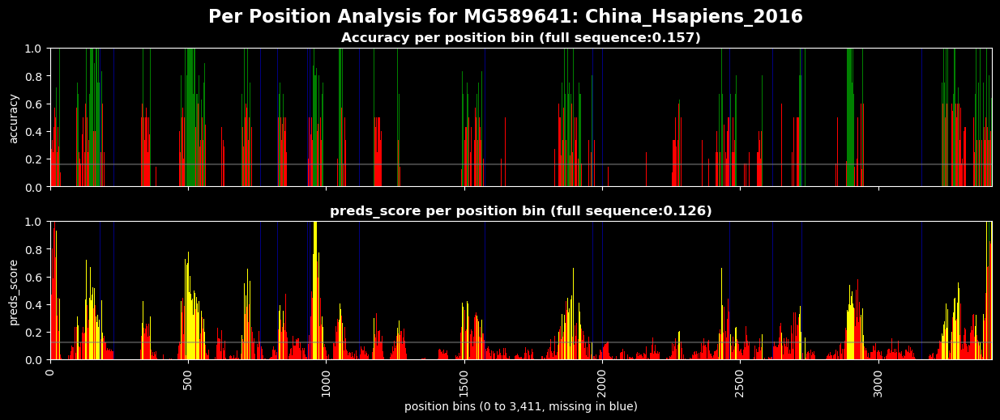

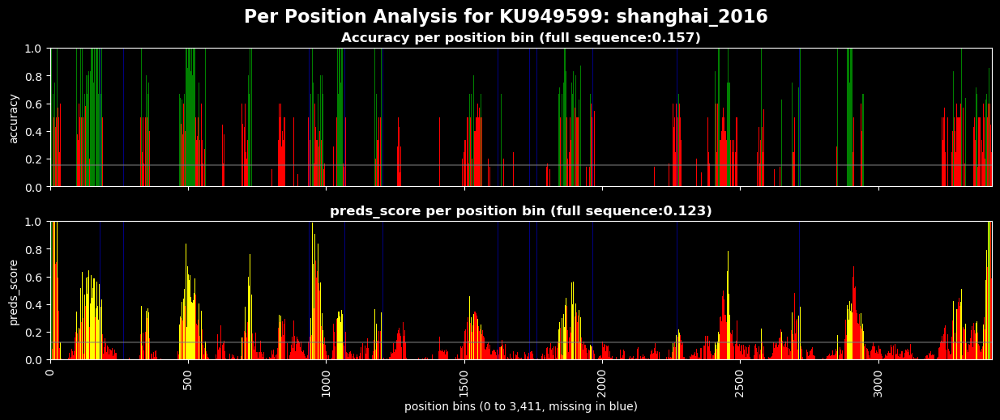

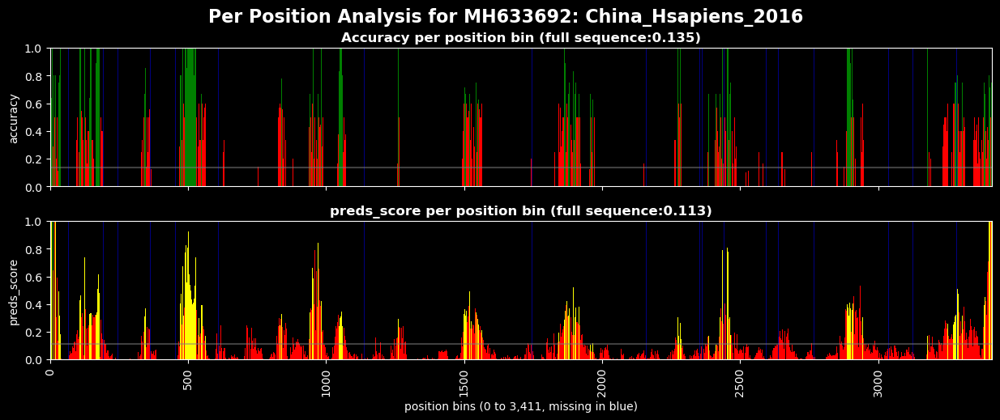

In [ ]:
for idx in ordered_index:
    plot_analysis_per_position(df, idx)

## Compare sequences

In [ ]:
fa = FastaFileReader(pfs.data/'ncbi/refsequences/yf/yf_2023_yellow_fever.fa')
aln = AlnFileReader(pfs.data/'ncbi/simreads/yf/single_69seq_150bp/single_69seq_150bp.aln')
refseq_meta = aln.parse_header_reference_sequences()

In [ ]:
accessions = ['U21056','ON323052', 'MH633692']
ids = [k for k,v in refseq_meta.items() if v['refseq_accession'] in accessions]
pprint({k:refseq_meta[k] for k in ids})

{'11089:ncbi:6': {'organism': 'Senegal_1927',
                  'refseq_accession': 'U21056',
                  'refseq_length': '10237',
                  'refseqid': '11089:ncbi:6',
                  'refseqnb': '6',
                  'refsource': 'ncbi',
                  'reftaxonomyid': '11089'},
 '11089:ncbi:61': {'organism': 'China_Hsapiens_2016',
                   'refseq_accession': 'MH633692',
                   'refseq_length': '10237',
                   'refseqid': '11089:ncbi:61',
                   'refseqnb': '61',
                   'refsource': 'ncbi',
                   'reftaxonomyid': '11089'},
 '11089:ncbi:64': {'organism': 'Nigeria_2020',
                   'refseq_accession': 'ON323052',
                   'refseq_length': '10237',
                   'refseqid': '11089:ncbi:64',
                   'refseqnb': '64',
                   'refsource': 'ncbi',
                   'reftaxonomyid': '11089'}}


In [ ]:
fa.reset_iterator()
seqs = {fa.parse_text(o['definition line'])['seqid']:o['sequence'] for o in fa if fa.parse_text(o['definition line'])['accession'] in accessions}
seqs

{'11089:ncbi:6': 'ATGTCTGGTCGTAAAGCTCAGGGAAAAACCCTGGGCGTCAATATGGTACGACGAGGAGTTCGCTCCTTGTCAAACAAAATAAAACAAAAAACAAAACAAATTGGAAACAGACCTGGACCTTCAAGAGGTGTTCAAGGATTTATCTTTTTCTTTTTGTTCAACATTTTGACTGGAAAAAAGATCACGGCCCACCTAAAGAGGTTGTGGAAAATGCTGGACCCAAGACAAGGCTTGGCTGTTCTAAGGAAAGTTAAGAGAGTGGTGGCCAGTTTGATGAGAGGATTGTCCTCAAGGAAACGCCGTTCCCATGATGTTCTGACTGTGCAATTCCTAATTTTGGGAATGCTGTTGATGACGGGTGGAGTGACCTTGGTGCGGAAAAACAGATGGTTGCTCCTAAATGTGACATCTGAGGACCTCGGGAAAACATTCTCTGTGGGCACAGGCAACTGCACAACAAACATTTTGGAAGCCAAGTACTGGTGCCCAGACTCAATGGAATACAACTGTCCCAATCTCAGTCCAAGAGAGGAGCCAGATGACATTGATTGCTGGTGCTATGGGGTGGAAAACGTTAGAGTCGCATATGGTAAGTGTGACTCAGCAGGCAGGTCTAGGAGGTCAAGAAGGGCCATTGACTTGCCTACGCATGAAAACCATGGTTTGAAGACCCGGCAAGAAAAATGGATGACTGGAAGAATGGGTGAAAGGCAACTCCAAAAGATTGAGAGATGGCTCGTGAGGAACCCCTTTTTTGCAGTGACAGCTCTGACCATTGCCTACCTTGTGGGAAGCAACATGACGCAACGAGTCGTGATTGCCCTACTGGTCTTGGCTGTTGGTCCGGCCTACTCAGCTCACTGCATTGGAATTACTGACAGGGATTTCATTGAGGGGGTGCATGGAGGAACTTGGGTTTCAGCTACCCTGGAGCAAGACAAGTGTGTCACTGTTATGGCCCCTGACAAGCCTTCATTGGACA

In [ ]:
bin_limits = pos_bins.astype(int).tolist()
bin_limits[:5], bin_limits[-5:]

([-10, 2, 5, 8, 11], [10074, 10077, 10080, 10083, 10086])

In [ ]:
def split_seq_in_bins(seq, bins):
    s = ''
    for i,c in enumerate(seq):
        if i-1 in bins:
            s += ' ' + c
        else:
            s += c
    return s

b = seqs['11089:ncbi:6']
print(split_seq_in_bins(b, bin_limits))

ATG TCT GGT CGT AAA GCT CAG GGA AAA ACC CTG GGC GTC AAT ATG GTA CGA CGA GGA GTT CGC TCC TT GTC AAA CAA AAT AAA ACA AAA AAC AAA ACA AAT TGG AAA CAG ACC TGG ACC TTC AAG AGG TGT TCA AG GAT TTA TCT TTT TCT TTT TGT TCA ACA TTT TGA CTG GAA AAA AGA TCA CGG CCC ACC TAA AGA GGT TG TGG AAA ATG CTG GAC CCA AGA CAA GGC TTG GCT GTT CTA AGG AAA GTT AAG AGA GTG GTG GCC AG TTT GAT GAG AGG ATT GTC CTC AAG GAA ACG CCG TTC CCA TGA TGT TCT GAC TGT GCA ATT CCT AAT TT TGG GAA TGC TGT TGA TGA CGG GTG GAG TGA CCT TGG TGC GGA AAA ACA GAT GGT TGC TCC TAA ATG TG ACA TCT GAG GAC CTC GGG AAA ACA TTC TCT GTG GGC ACA GGC AAC TGC ACA ACA AAC ATT TTG GAA GC CAA GTA CTG GTG CCC AGA CTC AAT GGA ATA CAA CTG TCC CAA TCT CAG TCC AAG AGA GGA GCC AG ATG ACA TTG ATT GCT GGT GCT ATG GGG TGG AAA ACG TTA GAG TCG CAT ATG GTA AGT GTG ACT CAG CA GGC AGG TCT AGG AGG TCA AGA AGG GCC ATT GAC TTG CCT ACG CAT GAA AAC CAT GGT TTG AAG ACC CG GCA AGA AAA ATG GAT GAC TGG AAG AAT GGG TGA AAG GCA ACT CCA AAA GAT TGA GAG ATG GCT CGT GA GGA ACC

In [ ]:
def compare_seqs(base, seq):
    comp = ''
    diffs = 0
    for i,(b,s) in enumerate(zip(base,seq)):
        if b == s:
            comp += ' '
        else:
            comp += s
            diffs += 1
    return comp, diffs

fa.reset_iterator()
all_seqs = {fa.parse_text(o['definition line'])['seqid']:o for o in fa}
b = all_seqs['11089:ncbi:6']['sequence']

p2seqdiffs = pfs.data / 'ncbi/infer_results/yf-ncbi/analysis/sequence-differences.txt'
p2seqdiffs.touch()

with open(p2seqdiffs, 'w') as f:
    for i, idx in enumerate(ordered_index):
        meta = fa.parse_text(all_seqs[idx]['definition line'])
        s = all_seqs[idx]['sequence']
        c, diffs = compare_seqs(b,s)
        line1 = f"{'='*refseq_length}"
        line2 = f"{idx:15s} {meta['accession']:15s} {meta['organism']:40s} {diffs} differences"
        line3 = split_seq_in_bins(b, bin_limits)
        line4 = split_seq_in_bins(c, bin_limits)
        line5 = split_seq_in_bins(s, bin_limits)
        f.write(line1+'\n')
        f.write(line2+'\n')
        f.write(line3+'\n')
        f.write(line4+'\n')
        f.write(line5+'\n')
        if i < 5:
            print(line1)
            print(line2)
            print(line3)
            print(line4)
            print(line5)
            print()

11089:ncbi:6    U21056          Senegal_1927                             0 differences
ATG TCT GGT CGT AAA GCT CAG GGA AAA ACC CTG GGC GTC AAT ATG GTA CGA CGA GGA GTT CGC TCC TT GTC AAA CAA AAT AAA ACA AAA AAC AAA ACA AAT TGG AAA CAG ACC TGG ACC TTC AAG AGG TGT TCA AG GAT TTA TCT TTT TCT TTT TGT TCA ACA TTT TGA CTG GAA AAA AGA TCA CGG CCC ACC TAA AGA GGT TG TGG AAA ATG CTG GAC CCA AGA CAA GGC TTG GCT GTT CTA AGG AAA GTT AAG AGA GTG GTG GCC AG TTT GAT GAG AGG ATT GTC CTC AAG GAA ACG CCG TTC CCA TGA TGT TCT GAC TGT GCA ATT CCT AAT TT TGG GAA TGC TGT TGA TGA CGG GTG GAG TGA CCT TGG TGC GGA AAA ACA GAT GGT TGC TCC TAA ATG TG ACA TCT GAG GAC CTC GGG AAA ACA TTC TCT GTG GGC ACA GGC AAC TGC ACA ACA AAC ATT TTG GAA GC CAA GTA CTG GTG CCC AGA CTC AAT GGA ATA CAA CTG TCC CAA TCT CAG TCC AAG AGA GGA GCC AG ATG ACA TTG ATT GCT GGT GCT ATG GGG TGG AAA ACG TTA GAG TCG CAT ATG GTA AGT GTG ACT CAG CA GGC AGG TCT AGG AGG TCA AGA AGG GCC ATT GAC TTG CCT ACG CAT GAA AAC CAT GGT TTG AAG ACC CG GCA AGA AAA

In [ ]:
reader = TextFileBaseReader(p2seqdiffs, nlines=5)
l = 'U21056 JX898878 U54798 JF912190 AY968065 MH633692'.split(' ')

for block in reader:
    lines = block.split('\n')
    if any([accession in lines[1] for accession in l]):
        print('\n'.join([f"{l[:160]} ..." for l in lines]))


================================================================================================================================================================ ...
11089:ncbi:6    U21056          Senegal_1927                             0 differences ...
ATG TCT GGT CGT AAA GCT CAG GGA AAA ACC CTG GGC GTC AAT ATG GTA CGA CGA GGA GTT CGC TCC TT GTC AAA CAA AAT AAA ACA AAA AAC AAA ACA AAT TGG AAA CAG ACC TGG ACC T ...
                                                                                                                                                                 ...
ATG TCT GGT CGT AAA GCT CAG GGA AAA ACC CTG GGC GTC AAT ATG GTA CGA CGA GGA GTT CGC TCC TT GTC AAA CAA AAT AAA ACA AAA AAC AAA ACA AAT TGG AAA CAG ACC TGG ACC T ...
 ...
================================================================================================================================================================ ...
11089:ncbi:14   JX898878        ArD181250_Senegal_2005                   368 di

## Impact Mutation on Accuracy

### Naive mutation analysis 

(comparing bp in each position as all sequences seem pretty well aligned)

Load CNN Virus training reference sequence (NC_002031.1)

In [ ]:
p2cnn_virus_seq = pfs.data / 'ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa'
assert p2cnn_virus_seq.is_file()
cnn_virus_fa = FastaFileReader(p2cnn_virus_seq)
cnn_virus_meta = cnn_virus_fa.parse_file(add_seq=True)
cnn_virus_seq = cnn_virus_meta['11089:ncbi:0']['sequence']
len(cnn_virus_seq), refseq_length, cnn_virus_seq[:10]

(10236, 10237, 'ATGTCTGGTC')

Bins are defined by the limits in `bin_limits`, created when we binned the positions.

In [ ]:
bin_limits[:5], bin_limits[-5:]

([-10, 2, 5, 8, 11], [10074, 10077, 10080, 10083, 10086])

Now we want to create a list of tuples (position_start, position_end), giving the minimum first BP position and the maximum last BP position for all reads in each bin. 

Note: the total length between position_starty and position_end should be equal to 150 + size of bin.

In [ ]:
bin_low_limit = np.array(bin_limits)
bin_high_limit = bin_low_limit + 150
read_ranges = [(max(0,l),h) for l,h in zip(bin_low_limit[:-1], bin_high_limit[1:])]
nb_bins, len(read_ranges), read_ranges[:5]

(3412, 3412, [(0, 152), (2, 155), (5, 158), (8, 161), (11, 164)])

build a dataset as a dictionary:
```python
{
    'refseqid': {
        'accuracy': accuracy,
        'preds_score': preds_score,
        'probs_score': probs_score,
        'reads': {
            pos: {
                'range': (start, end)
                'read': 'sequence,
                'mutations': mutations
            }
        }
    }
}
```

In [ ]:
refseqid = '11089:ncbi:1'

df_ = df.loc[df['refseqid'] == refseqid, :]
base_seqid = '11089:ncbi:6'
base_seq = all_seqs[base_seqid]['sequence']

cnn_virus_seq = cnn_virus_meta['11089:ncbi:0']['sequence']

info = df_refseqs.loc[refseqid,'info']
seq = all_seqs[refseqid]['sequence']

accuracy = df_refseqs.loc[refseqid,'mean acc']
preds_score = df_['preds_score'].mean()
probs_score = df_['probs_score'].mean()

refseq_dict = {}
refseq_dict['refseqid'] = refseqid
refseq_dict['info'] = info
refseq_dict['definition line'] = all_seqs[refseqid]['definition line']
refseq_dict['sequence'] = seq
refseq_dict['accuracy'] = accuracy
refseq_dict['preds_score'] = preds_score
refseq_dict['probs_score'] = probs_score

cnn_virus_reads = [cnn_virus_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
base_reads = [base_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
base_mutations = [compare_seqs(base=c, seq=b)[0] for c,b in zip(cnn_virus_reads, base_reads)]
reads = [seq[s:e] for k, (s,e) in enumerate(read_ranges)]
mutations = [compare_seqs(base=b, seq=s)[0] for b,s in zip(base_reads, reads)]

refseq_dict['position'] = {i:{'base':b, 'cnn_virus':c,'read':r, 'base_mutation':bm, 'mutation':m} for i,(b,c,r,bm,m) in enumerate(zip(base_reads,cnn_virus_reads, reads,base_mutations,mutations))}

n = 3100
print(refseq_dict['position'][n]['cnn_virus'])
print(refseq_dict['position'][n]['base_mutation'])
print(refseq_dict['position'][n]['base'])
print(refseq_dict['position'][n]['mutation'])
print(refseq_dict['position'][n]['read'])


ATGATGAACAGGAGATCTTGAACTACATGAGCCCACATCACAAAAAACTGGCACAAGCAGTGATGGAAATGACATACAAGAACAAAGTGGTGAAAGTGTTGAGACCAGCCCCAGGAGGGAAAGCCTACATGGATGTCATAAGTCGACGAGACC
 CCT   TG T  ACAGGA  T  TG ACTA ATGAGC CAC TC CAAAAA  TG   CAAGCA TG   GA ATG CAT    GAACAAAGTG   AAAGTGTTGAGA    CCCCAGG  GGA AGCCT CA GGATGTCAT A TCGA 
ACCTTGATGATGAACAGGAGATCTTGAACTACATGAGCCCACATCACAAAAAACTGGCACAAGCAGTGATGGAAATGACATACAAGAACAAAGTGGTGAAAGTGTTGAGACCAGCCCCAGGAGGGAAAGCCTACATGGATGTCATAAGTCGAC
    G     C  G  A      A   GT           TG A  A GG  G     CTGG  CA A                             C  G   C    G              C  G    T      CA    C  C  GA
ACCTGGATGACGAGCAAGAGATCATGAGTTACATGAGCCCTGAACAAAGGAAGCTGGCCTGGGCCATAATGGAAATGACATACAAGAACAAAGTGGTCAAGGTGCTGAGGCCAGCCCCAGGAGGCAAGGCCTTCATGGACATCATCAGCCGGA


In [ ]:
def analyze_position(df: pd.DataFrame, refseqid:str, cnn_virus_seq=cnn_virus_seq):
    base_seqid = '11089:ncbi:6'
    base_seq = all_seqs[base_seqid]['sequence']
    df_ = df.loc[df['refseqid'] == refseqid, :]
    
    info = df_refseqs.loc[refseqid,'info']
    seq = all_seqs[refseqid]['sequence']

    accuracy = df_refseqs.loc[refseqid,'mean acc']
    preds_score = df_['preds_score'].mean()
    probs_score = df_['probs_score'].mean()

    refseq_dict = {}
    refseq_dict['refseqid'] = refseqid
    refseq_dict['info'] = info
    refseq_dict['definition line'] = all_seqs[refseqid]['definition line']
    refseq_dict['sequence'] = seq
    refseq_dict['accuracy'] = accuracy
    refseq_dict['preds_score'] = preds_score
    refseq_dict['probs_score'] = probs_score

    cnn_virus_reads = [cnn_virus_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
    base_reads = [base_seq[s:e] for k, (s,e) in enumerate(read_ranges)]
    reads = [seq[s:e] for k, (s,e) in enumerate(read_ranges)]
    mutations_cnn_virus = [compare_seqs(base=c, seq=r)[0] for c,r in zip(cnn_virus_reads, reads)]
    mutations_base = [compare_seqs(base=b, seq=r)[0] for b,r in zip(base_reads, reads)]

    nb_diffs_cnn_virus = [compare_seqs(base=c, seq=s)[1] for c,s in zip(cnn_virus_reads, reads)]
    nb_diffs_base = [compare_seqs(base=b, seq=s)[1] for b,s in zip(base_reads, reads)]

    refseq_dict['position'] = {
        i:{
            'read':r, 
            'read_base':b, 
            'read_cnn_virus':c,
            'mutation_from_cnn_virus':mc, 
            'mutation_from_base':mb,
            'diffs_cnn_virus':dc,
            'diffs_base':db
            } 
        for i,(b,c,r,mc,mb, dc, db) in enumerate(zip(base_reads,cnn_virus_reads,reads,mutations_cnn_virus,mutations_base,nb_diffs_cnn_virus, nb_diffs_base))
        }


    return refseq_dict

analyze_position(df, '11089:ncbi:1')

{'refseqid': '11089:ncbi:1',
 'info': 'AY968064: Angola_1971',
 'definition line': '>11089:ncbi:1\t1\tAY968064\t11089\tncbi\tAngola_1971',
 'sequence': 'ATGTCTGGTCGAAAAGCTCAGGGTAAAACCCTGGGCGTCAATATGGTAAGACGAGGGGTTCGCTCCTTGTCAAACAAAATAAAACAAAAAACAAAACAGATTGGAAACAGACCTGGCCCTTCAAGAGGTGTTCAAGGATTTATTTTCTTCTTTTTGTTTAACATTCTGACTGGGAAAAAGTTGACTGCTCATCTAAAAAAACTTTGGAGGATGCTTGATCCAAGGCAGGGACTTGCTGTACTGCGGAAGGTCAAAAGAGTTGTAGCTAGCTTAATGAGAGGACTGTCTTCCAGGAAACGTAGATCCAATGAAATGGCCTTGTTTCCACTCTTGTTACTGGGTTTGTTGGCTCTATCAGGAGGAGTGACCCTCGTCAGAAAGAACAGATGGTTGCTCTTGAATGTAACTGCTGAAGATCTGGGGAAAACGTTTTCAGTGGGAACTGGGAATTGCACCACGAATATTCTGGAAGCAAAATACTGGTGCCCCGACTCAATGGAGTACAATTGTCCCAATCTCAGTCCAAGAGAAGAGCCAGATGACATAGATTGCTGGTGTTATGGAGTGGAAAATGTCAGAGTGGCCTATGGAAGATGTGATGCGGTAGGGCGATCAAAACGTTCTAGGAGAGCGATTGATCTACCCACACATGAGAACCATGGACTAAAGACTCGGCAGGAGAAGTGGATGACTGGCAGAATGGGTGAGAGGCAGCTCCAGAAGATTGAAAGATGGCTGGTTAGGAATCCATTTTTTGCGGTCACAGCATTGGCAATAGCCTATCTGGTGGGTAACAACACGACGCAACGAGTGGTAATAGCACTACTGGTTCTAGCGGTTGGTCCAG

In [ ]:
genome_dict = {}
for idx in ordered_index:
    genome_dict[idx] = analyze_position(df, idx)

p2json = pfs.data / 'ncbi/infer_results/yf-ncbi/analysis/genome-analysis.json'
with open(p2json, 'w') as f:
    json.dump(genome_dict, f, indent=4)

In [ ]:
genome_dict['11089:ncbi:1']

{'refseqid': '11089:ncbi:1',
 'info': 'AY968064: Angola_1971',
 'definition line': '>11089:ncbi:1\t1\tAY968064\t11089\tncbi\tAngola_1971',
 'sequence': 'ATGTCTGGTCGAAAAGCTCAGGGTAAAACCCTGGGCGTCAATATGGTAAGACGAGGGGTTCGCTCCTTGTCAAACAAAATAAAACAAAAAACAAAACAGATTGGAAACAGACCTGGCCCTTCAAGAGGTGTTCAAGGATTTATTTTCTTCTTTTTGTTTAACATTCTGACTGGGAAAAAGTTGACTGCTCATCTAAAAAAACTTTGGAGGATGCTTGATCCAAGGCAGGGACTTGCTGTACTGCGGAAGGTCAAAAGAGTTGTAGCTAGCTTAATGAGAGGACTGTCTTCCAGGAAACGTAGATCCAATGAAATGGCCTTGTTTCCACTCTTGTTACTGGGTTTGTTGGCTCTATCAGGAGGAGTGACCCTCGTCAGAAAGAACAGATGGTTGCTCTTGAATGTAACTGCTGAAGATCTGGGGAAAACGTTTTCAGTGGGAACTGGGAATTGCACCACGAATATTCTGGAAGCAAAATACTGGTGCCCCGACTCAATGGAGTACAATTGTCCCAATCTCAGTCCAAGAGAAGAGCCAGATGACATAGATTGCTGGTGTTATGGAGTGGAAAATGTCAGAGTGGCCTATGGAAGATGTGATGCGGTAGGGCGATCAAAACGTTCTAGGAGAGCGATTGATCTACCCACACATGAGAACCATGGACTAAAGACTCGGCAGGAGAAGTGGATGACTGGCAGAATGGGTGAGAGGCAGCTCCAGAAGATTGAAAGATGGCTGGTTAGGAATCCATTTTTTGCGGTCACAGCATTGGCAATAGCCTATCTGGTGGGTAACAACACGACGCAACGAGTGGTAATAGCACTACTGGTTCTAGCGGTTGGTCCAG

In [ ]:
refseqid = '11089:ncbi:1'
df_ = df.loc[df['refseqid'] == refseqid, :].groupby('bin').mean()
good_pos = list(df_.loc[df_.accuracy > 0.75, :].index)
poor_pos = list(df_.loc[df_.accuracy < 0.25, :].index)
len(good_pos), good_pos[:5], len(poor_pos), poor_pos[:5]

(206, [9, 21, 22, 25, 28], 2459, [0, 1, 7, 10, 13])

In [ ]:
mutation_from_cnn_virus = []
mutation_from_base = []

df_ = df.loc[df['refseqid'] == refseqid, :].groupby('bin').mean()
for bin, row in df_.iterrows():
    mutation_from_cnn_virus.append(genome_dict[refseqid]['position'][bin]['diffs_cnn_virus'])
    mutation_from_base.append(genome_dict[refseqid]['position'][bin]['diffs_base'])

df_['mutation_from_cnn_virus'] = mutation_from_cnn_virus
df_['mutation_from_base'] = mutation_from_base

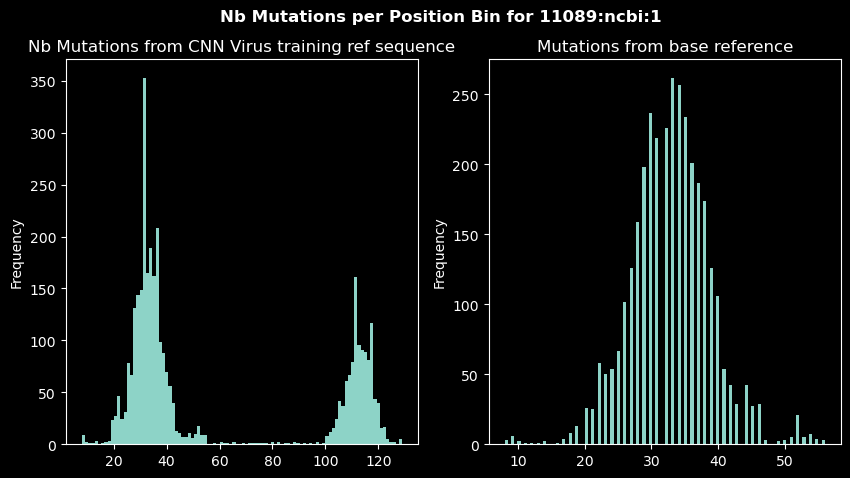

In [ ]:
fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
df_.mutation_from_cnn_virus.plot(ax=ax1,kind='hist', bins=100)
df_.mutation_from_base.plot(ax=ax2,kind='hist', bins=100)
fig.suptitle(f'Nb Mutations per Position Bin for {refseqid}', fontweight='bold')
ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
ax2.set_title('Mutations from base reference')
plt.show()

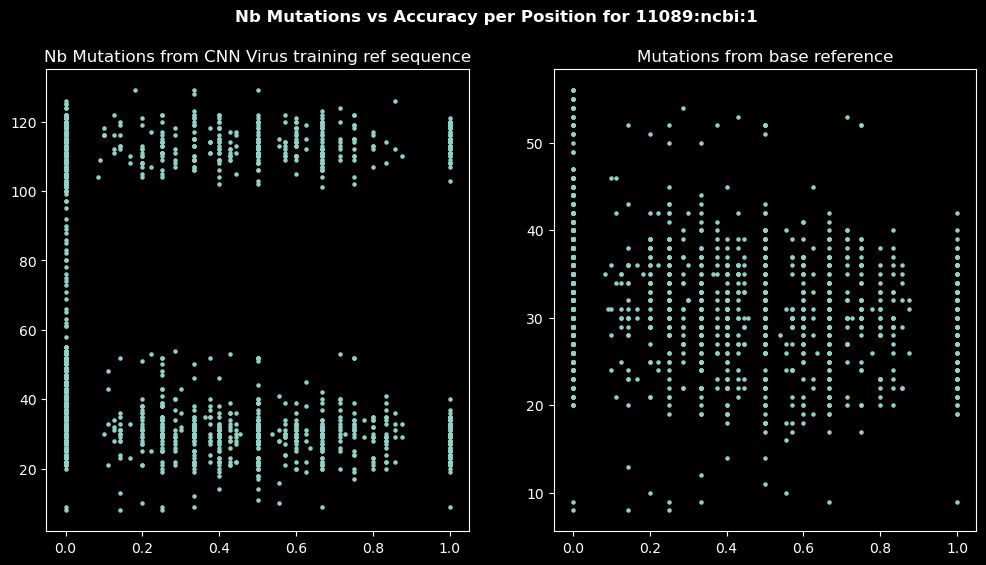

In [ ]:
fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
ax1.scatter(x=df_['accuracy'], y=df_['mutation_from_cnn_virus'], s=5)
ax2.scatter(x=df_['accuracy'], y=df_['mutation_from_base'], s=5)

fig.suptitle(f'Nb Mutations vs Accuracy per Position for {refseqid}', fontweight='bold')
ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
ax2.set_title('Mutations from base reference')
plt.show()

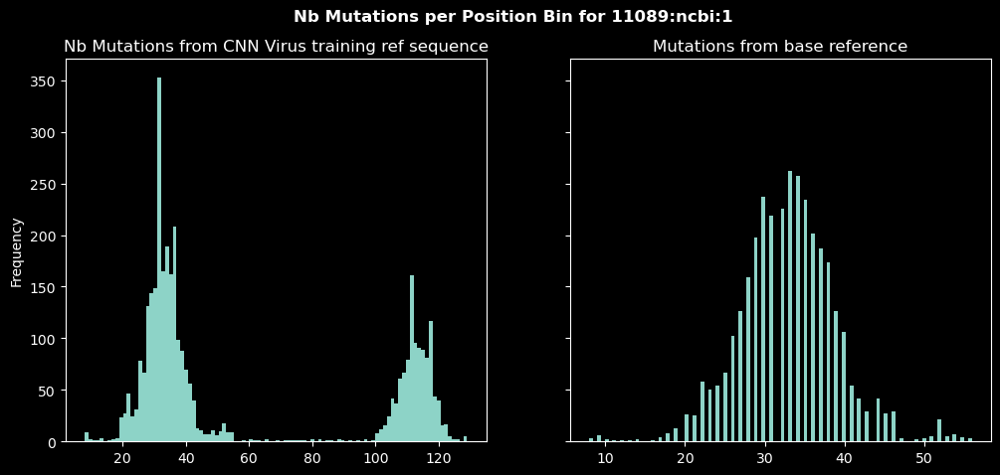

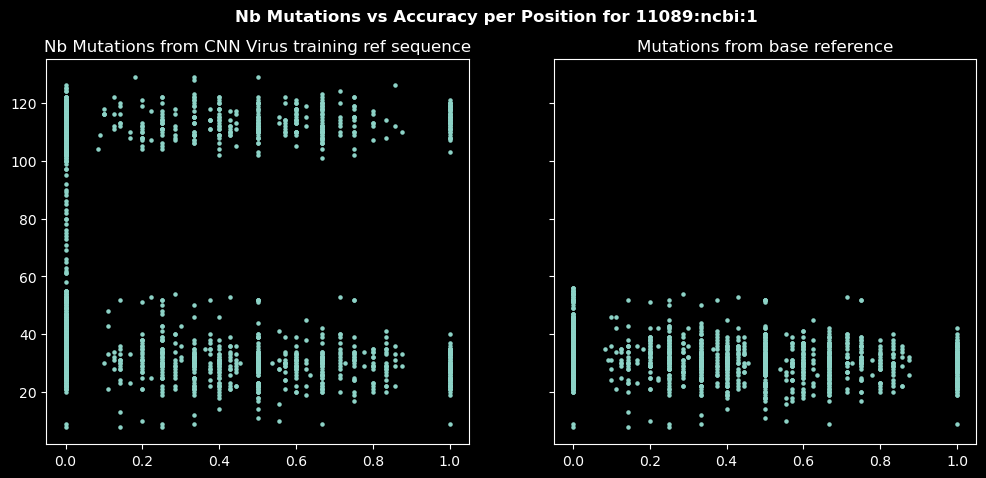

In [ ]:
def mutation_analysis(df:pd.DataFrame, refseqid):
    df_ = df.loc[df['refseqid'] == refseqid, :].groupby('bin').mean()
    df_['bin'] = df_.index
    df_['mutation_from_cnn_virus'] = df_['bin'].apply(lambda b: genome_dict[refseqid]['position'][b]['diffs_cnn_virus'])
    df_['mutation_from_base'] = df_['bin'].apply(lambda b: genome_dict[refseqid]['position'][b]['diffs_base'])

    fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), sharey=True)
    df_.mutation_from_cnn_virus.plot(ax=ax1,kind='hist', bins=100)
    df_.mutation_from_base.plot(ax=ax2,kind='hist', bins=100)
    fig.suptitle(f'Nb Mutations per Position Bin for {refseqid}', fontweight='bold')
    ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
    ax2.set_title('Mutations from base reference')
    plt.show()

    fig,(ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 5), sharey=True)
    ax1.scatter(x=df_['accuracy'], y=df_['mutation_from_cnn_virus'], s=5)
    ax2.scatter(x=df_['accuracy'], y=df_['mutation_from_base'], s=5)
    fig.suptitle(f'Nb Mutations vs Accuracy per Position for {refseqid}', fontweight='bold')
    ax1.set_title('Nb Mutations from CNN Virus training ref sequence')
    ax2.set_title('Mutations from base reference')
    plt.show()

mutation_analysis(df, refseqid)

### Align reads and sequences with bowtie2

Steps to proceed:
1. Build index for the CNN_Virus training sequence: 'data/ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa'
2. Align all reads to the CNN_Virus training sequence
3. Extract the alignment information for each read (position, QMAP score, CIGAR string, etc.)

> Note: use fq files that does not include gaps !

#### Create a bowtie2 index and Align reads

From CLI in folder: `data/ncbi/bowtie2/yf`

For end to end matches / untrimmed:
```zsh
conda activate bowtie
bowtie2-build ~/projects/bio/metagentools/data/ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa NC_002031.1
bowtie2 -x NC_002031.1 -U single_69seq_150bp_modified.fq -S single_69seq_cnn_virus_refseq_untrimmed.sam 

bowtie2 -x NC_002031.1 -U single_69seq_150bp_modified.fq -S single_69seq_cnn_virus_refseq_untrimmed.sam

    1145126 reads; of these:
    1145126 (100.00%) were unpaired; of these:
        615351 (53.74%) aligned 0 times
        529775 (46.26%) aligned exactly 1 time
        0 (0.00%) aligned >1 times
    46.26% overall alignment rate

conda deactivate
```

Alternative for non end to end matches / trimmed:
```zsh
conda activate bowtie
bowtie2-build ~/projects/bio/metagentools/data/ncbi/refsequences/yf/yf_NC_002031_full_sequence.fa NC_002031.1
bowtie2 --local -x NC_002031.1 -U single_69seq_150bp_modified.fq -S single_69seq_cnn_virus_refseq_trimmed.sam 

    1145126 reads; of these:
    1145126 (100.00%) were unpaired; of these:
        482900 (42.17%) aligned 0 times
        662140 (57.82%) aligned exactly 1 time
        86 (0.01%) aligned >1 times
    57.83% overall alignment rate

conda deactivate
```

#### Load SAM file

`Bio.Align.parse(source, fmt)`

Parse an alignment file and return an iterator over alignments.

Arguments:
-`source` - File or file-like object to read from, or filename as string.
-`fmt` - String describing the file format (case-insensitive).

Typical usage, opening a file to read in, and looping over the alignments:

`Bio.Align.sam.AlignmentIterator(source)`

Alignment iterator for Sequence Alignment/Map (SAM) files.

Each line in the file contains one genomic alignment, which are loaded and returned incrementally. The following columns are stored as attributes of the alignment:
- `flag`: The FLAG combination of bitwise flags;
-`mapq`: Mapping Quality (only stored if available)
- `rnext`: Reference sequence name of the primary alignment of the next read in the alignment (only stored if available)
- `pnext`: Zero-based position of the primary alignment of the next read in the template (only stored if available)
- `tlen`: signed observed template length (only stored if available)

Other information associated with the alignment by its tags are stored in the `annotations` attribute of each alignment.

Any hard clipping (clipped sequences not present in the query sequence) are stored as ‘hard_clip_left’ and ‘hard_clip_right’ in the annotations dictionary attribute of the query sequence record.

The sequence quality, if available, is stored as ‘phred_quality’ in the letter_annotations dictionary attribute of the query sequence record.

fmt: str | None= 'SAM'

In [ ]:
from Bio import Align

In [ ]:
p2sam = pfs.data / 'ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_trimmed.sam'
p2sam.is_file()

True

`QNAME               FLAG  RNAME  POS  MAPQ  CIGAR  RNEXT  PNEXT  TLEN  SEQ  QUAL  TAGS`

Unaligned read
```
11089:ncbi:1-17000	4	*	0	0	*	*	0	0	TGAGTACTTTGTGAGCCAATCATCAGAGTCTCTAAACACAAAGATGCCATCTCCGCATTTGAGCTCGCGTTTCCCAAAGTTGACAGCACATCCTTGGTCAGCCCCAACTCCCAATGAAAGAAACATCATGATCACACCTACCAAGATCAT	CCCGCGGGGGGGGJJ=CJJJJGJCJJJJJJGJJJJJ1JGJCJGJJJJJGJGGGGGJGGGJ=JGGGGGGGGGGGG=GGGGCGGGGCCGGGGGGCGCGGGC=JGGGGGGGC=CG=GGCGGGGCC=GGGCGCGGGCCCGGGGC=GCCGGGGG=	YT:Z:UU
```
Aligned read
```
11089:ncbi:1-16485	0	11089:ncbi:0	25	23	150M	*	0	0	AAAACCCTGGGCGTCAATATGGTAAGACGAGGGGTTCGCTCCTTGTCAAACAAAATAAAACAAAAAACAAAACAGATTGGAAACAGACCTGGCCCTTCAAGAGGTGTTCAAGGATTTATTTTCTTCTTTTTGTTTAACATTCTGACTGGG	=CCCGGG1GGGGGJCJJJJGJ=JCJGGJJGCJJGJJJGJJJGGGJGGGC=GCCJC=CGJGGJCGCJCJJGGGCG=GCC=GGGGGGGGGCGCGCGCGCGGCCGGCG(CCCCGGGCCGGG8CCCGGGCGGGGCGC=CC=GCGGGCGCC=C==	AS:i:-45	XN:i:0	XM:i:9	XO:i:0	XG:i:0	NM:i:9	MD:Z:24C7A41A17A26C2T11C6T7A0	YT:Z:UU
```

In [ ]:
alignments = Align.parse(p2sam, 'sam')

In [ ]:
type(alignments)

Bio.Align.sam.AlignmentIterator

In [ ]:
print(type(alignments))
for k in alignments.__dict__.keys():
    print(f"{k:15s}:", getattr(alignments, k))

<class 'Bio.Align.sam.AlignmentIterator'>
source         : /home/vtec/projects/bio/metagentools/data/ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_trimmed.sam
_stream        : <_io.TextIOWrapper name='/home/vtec/projects/bio/metagentools/data/ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_trimmed.sam' mode='rt' encoding='UTF-8'>
_index         : 0
metadata       : {'HD': {'VN': '1.5', 'SO': 'unsorted', 'GO': 'query'}, 'PG': [{'ID': 'bowtie2', 'PN': 'bowtie2', 'VN': '2.5.4', 'CL': '"/home/vtec/miniconda3/envs/bowtie/bin/bowtie2-align-s --wrapper basic-0 --local -x NC_002031.1 -S single_69seq_cnn_virus_refseq_trimmed.sam -U single_69seq_150bp_modified.fq"'}]}
targets        : [SeqRecord(seq=Seq(None, length=10236), id='11089:ncbi:0', name='<unknown name>', description='', dbxrefs=[])]
_line          : 11089:ncbi:1-17000	4	*	0	0	*	*	0	0	TGAGTACTTTGTGAGCCAATCATCAGAGTCTCTAAACACAAAGATGCCATCTCCGCATTTGAGCTCGCGTTTCCCAAAGTTGACAGCACATCCTTGGTCAGCCCCAACTCCCAATGAAAGAAACATCATGATCACACCTACCAAGATCAT	CCCG

`Align.parse` returns an iterator `Bio.Align.sam.AlignmentIterator` object.

`dict_keys(['sequences', 'coordinates', 'flag', 'mapq', 'annotations'])`

Search for the first read that was aligned (FLAG = 0) and show Align attributes

In [ ]:
print('Attributes for non aligned reads (FLAG=4):')
alignments = Align.parse(p2sam, 'sam')
for a in alignments:
    if (i+1)%10_000 == 0: print(i+1)
    if a.flag == 4:
        print(type(a))
        for k in a.__dict__.keys():
            print(f"  {k:15s}:", getattr(a, k))
        break

print('\nAttributes for aligned reads (FLAG=0):')
alignments = Align.parse(p2sam, 'sam')
for a in alignments:
    if (i+1)%10_000 == 0: print(i+1)
    if a.flag == 0:
        print(type(a))
        for k in a.__dict__.keys():
            print(f"  {k:15s}:", getattr(a, k))
        break

Attributes for non aligned reads (FLAG=4):
<class 'Bio.Align.Alignment'>
  sequences      : [None, SeqRecord(seq=Seq('TGAGTACTTTGTGAGCCAATCATCAGAGTCTCTAAACACAAAGATGCCATCTCC...CAT'), id='11089:ncbi:1-17000', name='<unknown name>', description='', dbxrefs=[])]
  coordinates    : None
  flag           : 4
  mapq           : 0
  annotations    : {'YT': 'UU'}

Attributes for aligned reads (FLAG=0):
<class 'Bio.Align.Alignment'>
  sequences      : [SeqRecord(seq=Seq({9225: 'ATGGAAATGACATACAAGAACAAAGTGGTGAAAGTGTTGAGACCAGCCCCAGGA...GAG'}, length=10236), id='11089:ncbi:0', name='<unknown name>', description='', dbxrefs=[]), SeqRecord(seq=Seq('ACATGAGCCCTGAACAAAGGAAGCTGGCCTGGGCCATAATGGAAATGACATACA...TTG'), id='11089:ncbi:1-16990', name='<unknown name>', description='', dbxrefs=[])]
  coordinates    : [[9225 9320]
 [  38  133]]
  flag           : 0
  mapq           : 22
  score          : 95
  annotations    : {'XN': 0, 'XM': 14, 'XO': 0, 'XG': 0, 'NM': 14, 'YT': 'UU'}


Make a list of all the FLAGs in the SAM file

In [ ]:
# alignments = Align.parse(p2sam, 'sam')
# flags = [0,4]
# for a in alignments:
#     if a.flag not in flags:
#         print(a.sequences[1].id, a.flag)
#         flags.append(a.flag)
# flags

- FLAG = 0 means that the read is aligned
- FLAG = 4 means that the read is unaligned
- FLAG = 16 means that the read is aligned to the reverse strand

```
sequences      : [SeqRecord(seq, id, name, description, dbxrefs), SeqRecord(seq, id, name, description, dbxrefs)]
coordinates    : array[[start_in_refseq end_in_refseq], [ start_read end_read]]
flag           : 0, 4 or 16
mapq           : int
score          : int
annotations    : {'XN': 0, 'XM': 16, 'XO': 0, 'XG': 0, 'NM': 16, 'YT': 'UU'}
```

Create a dataset with the relevant information for each reads:
- index: readid
- aligned: True/False
- refserid: str or None
- mapped-bp: int
- mapq: int or None
- score: int or None
- position: int or None


In [ ]:
alignments = Align.parse(p2sam, 'sam')

cols = 'aligned mappedseqid mapped-bp mapq score position'.split(' ')
sam_df = pd.DataFrame(columns=cols)
# sam_df
for i, a in enumerate(alignments):
    idx = a.sequences[1].id
    if a.flag in [0,16]:
        refseqid = a.sequences[0].id
        mapped_bp = a.coordinates[1,:].max()
        mapq = a.mapq
        score = a.score
        position = a.coordinates[0,:].min()
        row = pd.DataFrame([[True, refseqid, mapped_bp, mapq, score, position]], columns=cols, index=[idx])
        sam_df = row if sam_df.empty else pd.concat([sam_df, row])
    if a.flag in [4]:
        refseqid = np.nan
        mapped_bp = 0
        mapq = np.nan
        score = np.nan
        position = np.nan
        row = pd.DataFrame([[False, refseqid, mapped_bp, mapq, score, position]], columns=cols, index=[idx])
        sam_df = row if sam_df.empty else pd.concat([sam_df, row])
    if (i+1)%100_000 == 0: 
        print(i+1, sam_df.shape)
    # if sam_df.shape[0] > 500: break

sam_df.shape

100000 (100000, 6)
200000 (200000, 6)
300000 (300000, 6)
400000 (400000, 6)
500000 (500000, 6)
600000 (600000, 6)
700000 (700000, 6)
800000 (800000, 6)
900000 (900000, 6)
1000000 (1000000, 6)
1100000 (1100000, 6)


(1145126, 6)

save the dataset as a pickle file

In [ ]:
p2sam_df = pfs.data / 'ncbi/bowtie2/yf/single_69seq_cnn_virus_refseq_sam_df.csv'
# sam_df.to_parquet(p2sam_df)

sam_df = pd.read_parquet(p2sam_df)

In [ ]:
sam_df.loc[sam_df.aligned,:].shape, sam_df.loc[~sam_df.aligned,:].shape

((662226, 6), (482900, 6))

#### Merge df and sam_df

In [ ]:
common_idx = pd.Index(set(df.index).intersection(set(sam_df.index)))

coi = ['refseqid', 'accuracy', 'lbl_true', 'lbl_pred', 'pos_true', 'pos_pred', 'preds_score', 'probs_score', 'bin']
filtered_df = df.loc[common_idx, coi]
filtered_sam_df = sam_df.loc[common_idx, :]

ds = pd.concat([filtered_df, filtered_sam_df], axis=1)

ds.loc[ds.aligned,:].shape, ds.loc[~ds.aligned,:].shape

((480488, 15), (278570, 15))

In [ ]:
coi_sam = ['accuracy', 'mapped-bp', 'mapq', 'score']
ds.loc[:,coi_sam].sample(10)

,accuracy,mapped-bp,mapq,score
11089:ncbi:64-11045,True,150,44.0,282.0
11089:ncbi:31-8474,False,150,22.0,123.0
11089:ncbi:39-6457,False,0,NaN,NaN
11089:ncbi:19-2070,True,150,44.0,277.0
11089:ncbi:2-16637,True,150,44.0,263.0
11089:ncbi:66-8684,True,150,44.0,270.0
11089:ncbi:55-7490,False,0,NaN,NaN
11089:ncbi:44-13578,True,0,NaN,NaN
11089:ncbi:65-15345,True,150,44.0,259.0
11089:ncbi:12-2853,True,150,44.0,300.0


In [ ]:
grp_by_refseq = ds.groupby(['refseqid'])
grp_by_refseq_bins = ds.groupby(['refseqid', 'bin'])

In [ ]:
grp_by_refseq.count().loc[:, 'aligned'].min(), grp_by_refseq.count().loc[:, 'aligned'].max()

(12734, 16883)

In [ ]:
grp_by_refseq_bins.count().loc[:, 'aligned'].min(), grp_by_refseq_bins.count().loc[:, 'aligned'].max()

(0, 19)

In [ ]:
grp_by_refseq.mean().loc[:, coi_sam].sort_values('accuracy', ascending=False)

,accuracy,mapped-bp,mapq,score
refseqid,,,,
11089:ncbi:12,1.000000,149.985861,44.000000,297.666806
11089:ncbi:13,1.000000,149.952503,43.999880,292.780882
11089:ncbi:10,1.000000,149.963601,43.999761,294.092344
11089:ncbi:6,1.000000,149.943698,43.999881,291.222282
11089:ncbi:66,1.000000,149.867399,43.924262,279.461355
11089:ncbi:65,0.999940,149.724668,43.804453,276.034297
11089:ncbi:64,0.999642,149.806336,43.805418,272.966227
11089:ncbi:19,0.999462,149.623864,43.274614,258.571958
11089:ncbi:69,0.998979,149.460107,43.070833,254.362186


In [ ]:
# df_ = grp_by_refseq.mean().loc[:, coi_sam].sort_values('accuracy', ascending=False)

# fig,(ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))
# fig.suptitle('Accuracy vs Mapq and Mapping Score', fontweight='bold')
# ax1.scatter(x=df_.accuracy, y=df_.mapq, s=5)
# ax1.set_title('Accuracy vs Mapq')
# ax2.scatter(x=df_.accuracy, y=df_.score, s=5)
# ax2.set_title('Accuracy vs Score')
# plt.show()

6 15 15 22 46


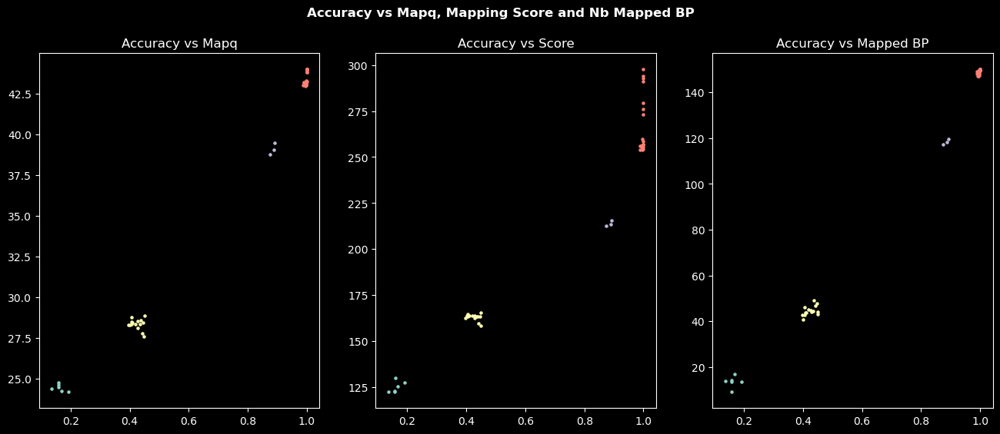

In [ ]:
df_ = grp_by_refseq.mean().loc[:, coi_sam].sort_values('accuracy', ascending=False)
low_acc_idx = df_.loc[df_.accuracy < 0.3, :].index
middle_low_acc_idx = pd.Index(set(df_.loc[df_.accuracy >= 0.3, :].index).intersection(set(df_.loc[df_.accuracy < 0.6, :].index)))
middle_high_acc_idx = pd.Index(set(df_.loc[df_.accuracy >= 0.8, :].index).intersection(set(df_.loc[df_.mapq < 41., :].index)))
high_acc_idx = pd.Index(set(df_.loc[df_.accuracy >= 0.8, :].index).intersection(set(df_.loc[df_.mapq >= 41., :].index)))

print(len(low_acc_idx), len(middle_low_acc_idx), len(middle_low_acc_idx), len(high_acc_idx), df_.shape[0])

fig,(ax1,ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(16, 6))
fig.suptitle('Accuracy vs Mapq, Mapping Score and Nb Mapped BP', fontweight='bold')
clusters_idxs = [low_acc_idx, middle_low_acc_idx, middle_high_acc_idx, high_acc_idx]
for idxs in clusters_idxs:
    ax1.scatter(x=df_.loc[idxs,'accuracy'], y=df_.loc[idxs,'mapq'], s=5)
    ax1.set_title(f'Accuracy vs Mapq')

    ax2.scatter(x=df_.loc[idxs,'accuracy'], y=df_.loc[idxs,'score'], s=5)
    ax2.set_title('Accuracy vs Score')
    
    ax3.scatter(x=df_.loc[idxs,'accuracy'], y=df_.loc[idxs,'mapped-bp'], s=5)
    ax3.set_title('Accuracy vs Mapped BP')
plt.show()

In [ ]:
for cluster, idxs in zip(['low', 'middle_low', 'middle_high', 'high'],clusters_idxs):
    print(f"Cluster {cluster} ({len(idxs)} refseqs):")
    for idx in idxs:
        print(f" - {idx}: {refseqid2index.get(idx, '?')}")

Cluster low (6 refseqs):
 - 11089:ncbi:7: AY968065_Uganda_1948
 - 11089:ncbi:1: AY968064_angola_1971
 - 11089:ncbi:55: JN620362_Uganda_2010
 - 11089:ncbi:58: MG589641_china_2016
 - 11089:ncbi:57: KU949599_shanghai_2016
 - 11089:ncbi:61: MH633692_China_2016
Cluster middle_low (15 refseqs):
 - 11089:ncbi:37: JF912190_Brazil_2002
 - 11089:ncbi:47: MK760660_Netherlands_2018
 - 11089:ncbi:32: JF912181_Brazil_1983
 - 11089:ncbi:31: MF004382_Bolivia_1999
 - 11089:ncbi:52: MK333805_Brazil_IlhaGrande_2018
 - 11089:ncbi:45: MK583152_Brazil_SaoPaulo_2017
 - 11089:ncbi:35: JF912182_Brazil_1984
 - 11089:ncbi:39: KM388814_Venezuela_Portuguesa_2005
 - 11089:ncbi:49: MF370549_Brazil_2015
 - 11089:ncbi:40: KM388815_Venezuela_Apure_2007
 - 11089:ncbi:41: KM388818_Venezuela_2006
 - 11089:ncbi:44: MH666058_Brazil_2016
 - 11089:ncbi:36: JF912188_Brazil_2000
 - 11089:ncbi:33: JF912179_Brazil_1980
 - 11089:ncbi:38: HM582851_TrinidadandTobago_2009
Cluster middle_high (3 refseqs):
 - 11089:ncbi:29: JX898869_Co

In [ ]:
threshold = 0.75
poor_alignment_idxs = grp_by_refseq.mean().loc[grp_by_refseq.mean().aligned < threshold, :].sort_values('aligned', ascending=False).index
print(f"{len(poor_alignment_idxs):,d} reference sequences for which with less than {int(threshold*100)}% of the reads could be aligned:")
for idx in poor_alignment_idxs:
    print(f" - {idx}: {refseqid2index.get(idx, '?')}")

# print(set(poor_alignment_idxs).difference(set(low_acc_idx).union(set(middle_low_acc_idx))))
# print((set(low_acc_idx).union(set(middle_low_acc_idx))).difference(set(poor_alignment_idxs)))

21 reference sequences for which with less than 75% of the reads could be aligned:
 - 11089:ncbi:38: HM582851_TrinidadandTobago_2009
 - 11089:ncbi:37: JF912190_Brazil_2002
 - 11089:ncbi:32: JF912181_Brazil_1983
 - 11089:ncbi:35: JF912182_Brazil_1984
 - 11089:ncbi:41: KM388818_Venezuela_2006
 - 11089:ncbi:40: KM388815_Venezuela_Apure_2007
 - 11089:ncbi:44: MH666058_Brazil_2016
 - 11089:ncbi:39: KM388814_Venezuela_Portuguesa_2005
 - 11089:ncbi:36: JF912188_Brazil_2000
 - 11089:ncbi:49: MF370549_Brazil_2015
 - 11089:ncbi:52: MK333805_Brazil_IlhaGrande_2018
 - 11089:ncbi:31: MF004382_Bolivia_1999
 - 11089:ncbi:47: MK760660_Netherlands_2018
 - 11089:ncbi:33: JF912179_Brazil_1980
 - 11089:ncbi:45: MK583152_Brazil_SaoPaulo_2017
 - 11089:ncbi:1: AY968064_angola_1971
 - 11089:ncbi:58: MG589641_china_2016
 - 11089:ncbi:61: MH633692_China_2016
 - 11089:ncbi:57: KU949599_shanghai_2016
 - 11089:ncbi:7: AY968065_Uganda_1948
 - 11089:ncbi:55: JN620362_Uganda_2010


These reference sequences with poor alignment are the same as the two lowes accuracy clusters

# Sandbox

## Plot sequences in color

In [ ]:
def bp2color(string:str, rows=3)->np.array:
    """
    Adenine (A): Often represented in green.
    Cytosine (C): Commonly shown in blue.
    Guanine (G): Frequently depicted in yellow or black.
    Thymine (T): Typically illustrated in red.
    """
    # s2c = {'A':np.array([0.,1.,0.]), 'C':np.array([0.,0.,1.]), 'G':np.array([1.,1.,0.]), 'T':np.array([1.,0.,0.]), ' ':np.array([0.,0.,0.])}
    s2c = {
        'A':np.array([143,199,150], dtype=np.uint8), 
        'C':np.array([131,208,240], dtype=np.uint8), 
        'G':np.array([255,245,154], dtype=np.uint8), 
        'T':np.array([241,159,193], dtype=np.uint8), 
        ' ':np.array([0,0,0], dtype=np.uint8)}
    return np.row_stack([np.expand_dims(np.array([s2c[s] for s in string]),axis=0)]*rows)

bp2color('ACGT')

array([[[143, 199, 150],
        [131, 208, 240],
        [255, 245, 154],
        [241, 159, 193]],

       [[143, 199, 150],
        [131, 208, 240],
        [255, 245, 154],
        [241, 159, 193]],

       [[143, 199, 150],
        [131, 208, 240],
        [255, 245, 154],
        [241, 159, 193]]], dtype=uint8)

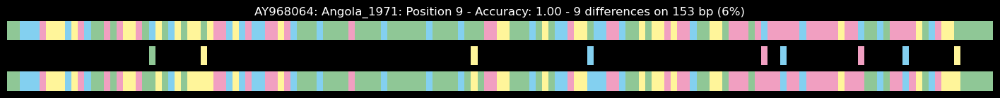

In [ ]:
def plot_reads(refseqid, position, acc):
    base = bp2color(genome_dict[refseqid]['position'][position]['base'])
    mutation = bp2color(genome_dict[refseqid]['position'][position]['mutation'])
    read = bp2color(genome_dict[refseqid]['position'][position]['read'])
    diffs = genome_dict[refseqid]['position'][position]['diffs']
    separator = np.zeros((1,base.shape[1],3), dtype=np.uint8)

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(18,2))
    title = f"{genome_dict[refseqid]['info']}: Position {position} - Accuracy: {acc:.2f} - {diffs} differences on {base.shape[1]} bp ({diffs/base.shape[1]:.0%})"
    ax.set_title(title, fontsize=12)
    img = np.row_stack([base, separator, mutation, separator, read])
    ax.imshow(img, aspect='equal')
    ax.axis('off')
    plt.show()

plot_reads('11089:ncbi:1', good_pos[0], 1)

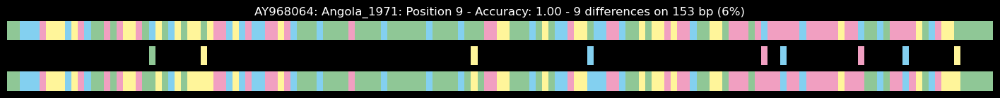

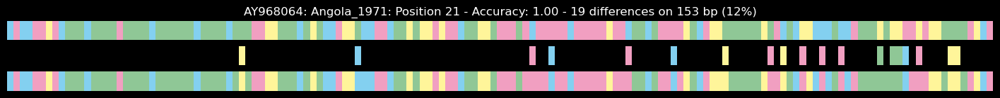

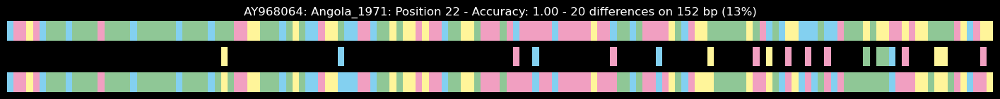

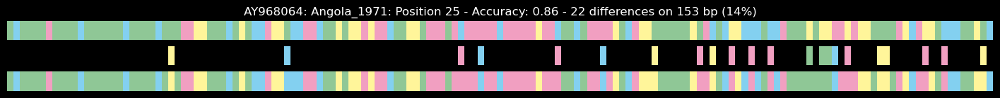

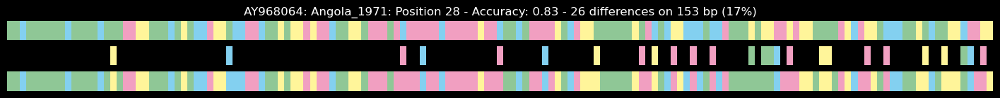

...

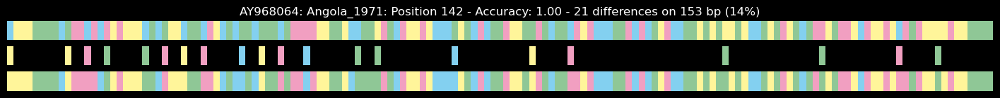

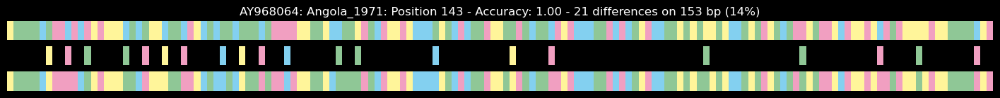

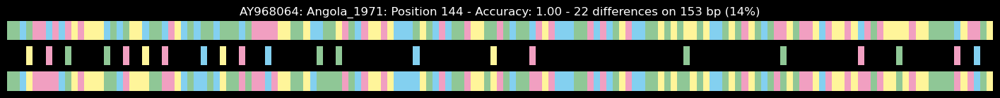

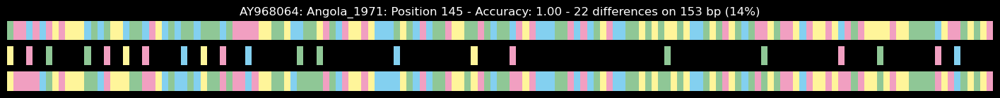

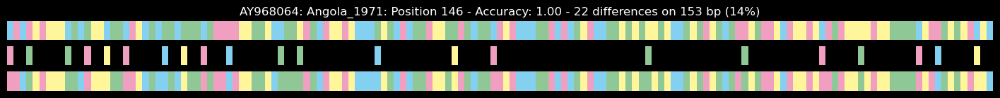

In [ ]:
for pos in good_pos[:20]:
    plot_reads(refseqid, pos, df_.loc[pos, 'accuracy'])

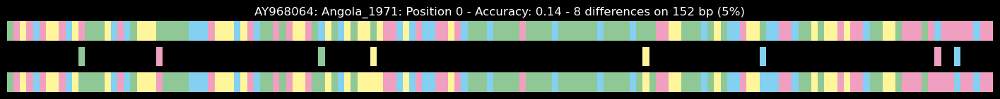

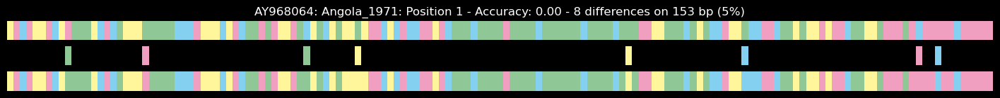

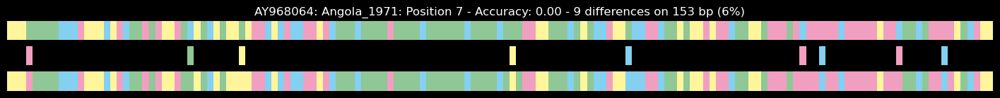

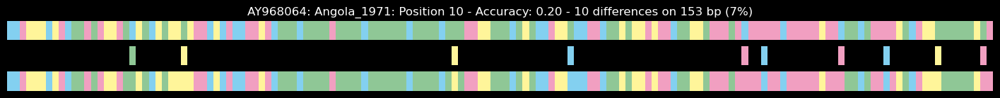

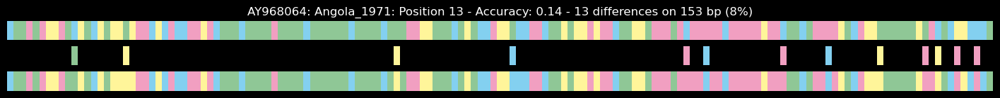

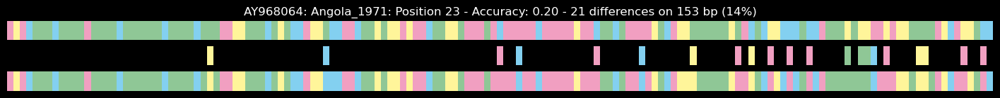

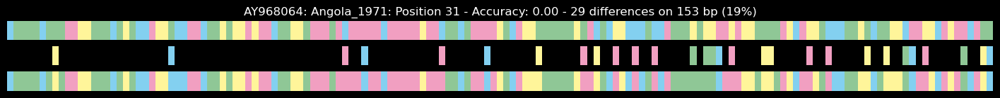

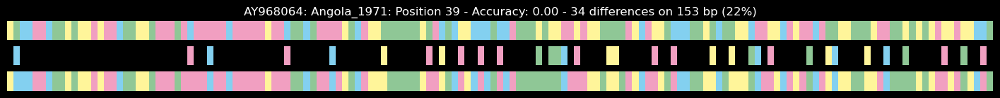

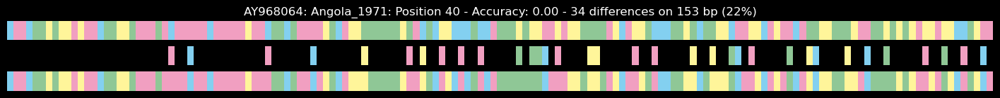

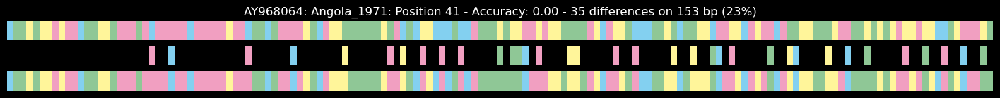

In [ ]:
for pos in poor_pos[:10]:
    plot_reads(refseqid, pos, df_.loc[pos, 'accuracy'])

## Distance Matrix

In [ ]:
p2matrix = pfs.data / 'ncbi/other/yf/YF_2023_envelop_percentage_distance_matrix.csv'
dist_mx = pd.read_csv(p2matrix, index_col=0)
for col in dist_mx.columns:
    dist_mx[col] = dist_mx[col].str.rstrip('%').astype(float)/100
dist_mx

,YFV_Cameroon_2023,YFV_CAR_2019,U21056_senegal_1927,JX898870_senegal_1996,U23574_Senegal_1965,JX898868_Senegal_1995,JX898873_ArD149214_Senegal_2000,JX898874_ArD149194_Senegal_2000,JX898875_Senegal_2000,JX898876_Senegal_2001,...,MH666058_Brazil_2016,MF370547_Brazil_2017,MK583152_Brazil_SaoPaulo_2017,KY885001_Brazil_2017,MW308134_Brazil_2018,MK760660_Netherlands_2018,MK333805_Brazil_IlhaGrande_2018,MW308135_Brazil_2019,MZ604867_Brazil_2019,MZ712143_Brazil_2021
,,,,,,,,,,,,,,,,,,,,,
YFV_Cameroon_2023,0.00,0.04,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19,...,0.19,0.18,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19
YFV_CAR_2019,0.04,0.00,0.19,0.18,0.18,0.18,0.18,0.18,0.18,0.18,...,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19,0.19
U21056_senegal_1927,0.19,0.19,0.00,0.04,0.04,0.04,0.05,0.05,0.05,0.04,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
JX898870_senegal_1996,0.19,0.18,0.04,0.00,0.03,0.00,0.03,0.03,0.03,0.03,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
U23574_Senegal_1965,0.19,0.18,0.04,0.03,0.00,0.03,0.04,0.04,0.04,0.03,...,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MK760660_Netherlands_2018,0.19,0.19,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
MK333805_Brazil_IlhaGrande_2018,0.19,0.19,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
MW308135_Brazil_2019,0.19,0.19,0.15,0.15,0.15,0.15,0.15,0.15,0.15,0.15,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


Extract sequences accession from the distance matrix

In [ ]:
distance_accessions = {}
missing=[]
for col in dist_mx.columns:
    regex = re.compile(r'^(?P<accession>\w{1,2}\d*)_(?P<country>.*)_(?P<year>\d\d\d\d)$')
    match = regex.search(col)
    if match: 
        accession = match.group('accession')
        subdict = {
            'accession': accession, 
            'country': match.group('country'), 
            'year': match.group('year'),
            'definition line': col
            } 
        distance_accessions[accession] = subdict
    else:
        missing =+ 1
        print(col, 'could not find the accession')

distance_accessions['U21056']

YFV_Cameroon_2023 could not find the accession
YFV_CAR_2019 could not find the accession
Yellow_fever_YF118_CAR_2018 could not find the accession


{'accession': 'U21056', 'country': 'senegal', 'year': '1927', 'definition line': 'U21056_senegal_1927'}

In [ ]:
print(f"{'Accession':10s} {'refseqid':15s} Variant")
for i, refseqid in enumerate(df_refseqs.index):
    accession = df_refseqs.loc[refseqid, 'refseq_accession']
    print(f"{accession:10s} {refseqid:15s} {distance_accessions.get(accession, 'not found')['definition line']}")

Accession  refseqid        Variant
AY968064   11089:ncbi:1    AY968064_angola_1971
U54798     11089:ncbi:2    U54798_Ivory_Coast_1982
AY572535   11089:ncbi:4    AY572535_Gambia_2001
U21056     11089:ncbi:6    U21056_senegal_1927
AY968065   11089:ncbi:7    AY968065_Uganda_1948
GQ379163   11089:ncbi:10   GQ379163_Peru_2007
MF289572   11089:ncbi:12   MF289572_Singapore_2017
KU978764   11089:ncbi:13   KU978764_Sudan_1941
JX898878   11089:ncbi:14   JX898878_ArD181250_Senegal_2005
JX898877   11089:ncbi:18   JX898877_ArD181464_Senegal_2005
JX898876   11089:ncbi:19   JX898876_Senegal_2001
KU978765   11089:ncbi:20   KU978765_GuineaBissau_1965
JX898870   11089:ncbi:21   JX898870_senegal_1996
JX898868   11089:ncbi:22   JX898868_Senegal_1995
JX898875   11089:ncbi:23   JX898875_Senegal_2000
JX898874   11089:ncbi:24   JX898874_ArD149194_Senegal_2000
JX898873   11089:ncbi:25   JX898873_ArD149214_Senegal_2000
MK292067   11089:ncbi:26   MK292067_Netherlands_2018
MN958078   11089:ncbi:28   MN958078_Nige

In [ ]:
file_stem = 'single_69seq_150bp'

p2aln = pfs.data / f"ncbi/simreads/yf/{file_stem[:-2] if file_stem[-1] in ['1', '2'] else file_stem}/{file_stem}.aln"
assert p2aln.exists()
aln = AlnFileReader(p2aln)
refseq_metadata = aln.parse_header_reference_sequences()
refseq_metadata['11089:ncbi:1']

{'organism': 'Angola_1971', 'refseq_accession': 'AY968064', 'refseq_length': '10237', 'refseqid': '11089:ncbi:1', 'refseqnb': '1', 'refsource': 'ncbi', 'reftaxonomyid': '11089'}

In [ ]:
for selected in selected_refseqs:
    accession = refseq_metadata[selected]['refseq_accession']
    print(f"{selected:14s}    {refseq_metadata[selected]['organism']:25s}    {refseq_metadata[selected]['refseq_accession']:20s}   {distance_accessions[accession]['definition line']:30s}")

11089:ncbi:1      Angola_1971                  AY968064               AY968064_angola_1971          
11089:ncbi:2      Ivory_Coast_1982             U54798                 U54798_Ivory_Coast_1982       
11089:ncbi:4      Gambia_2001                  AY572535               AY572535_Gambia_2001          
11089:ncbi:6      Senegal_1927                 U21056                 U21056_senegal_1927           
11089:ncbi:7      Uganda_1948                  AY968065               AY968065_Uganda_1948          
11089:ncbi:10     Peru_Hsapiens_2007           GQ379163               GQ379163_Peru_2007            
11089:ncbi:12     Singapore_2017               MF289572               MF289572_Singapore_2017       
11089:ncbi:13     Sudan_Hsapiens_1941          KU978764               KU978764_Sudan_1941           
11089:ncbi:14     ArD181250_Senegal_2005       JX898878               JX898878_ArD181250_Senegal_2005
11089:ncbi:18     ArD181464_Senegal_2005       JX898877               JX898877_ArD181464_S

In [ ]:
dist_mx.max().max(), dist_mx.min().min()

(0.29, 0.0)

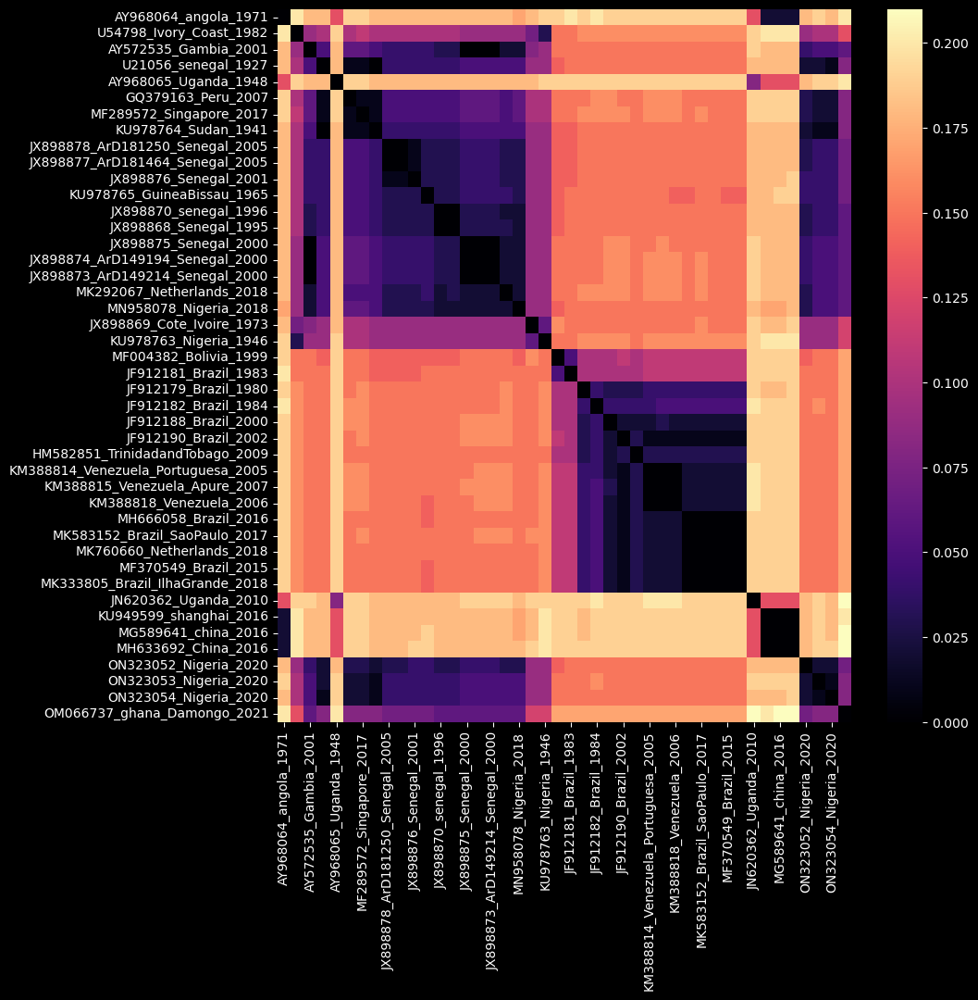

In [ ]:
refseqid2dist_mx_idx = {}
dist_mx_idx2refseqid = {}

for refseqid in selected_refseqs:
    accession = refseq_metadata[refseqid]['refseq_accession']
    idx = distance_accessions[accession]['definition line']
    refseqid2dist_mx_idx[refseqid] = idx
    dist_mx_idx2refseqid[idx] = refseqid

selected_dist_idxs = [refseqid2dist_mx_idx[rsid] for rsid in selected_refseqs]
selected_dist = dist_mx.loc[selected_dist_idxs, selected_dist_idxs]
# selected_dist.index=selected_refseqs
# selected_dist.columns=selected_refseqs
selected_dist.index=[refseqid2dist_mx_idx[seqid] for seqid in selected_refseqs]
selected_dist.columns=[refseqid2dist_mx_idx[seqid] for seqid in selected_refseqs]
plt.figure(figsize=(10,10))
sns.heatmap(selected_dist, cmap='magma');
# ['viridis', 'plasma', 'inferno', 'magma', 'cividis']

## Define critical level for scores

In [ ]:
df.head(3)

,refseqid,accuracy,lbl_true,lbl_pred,pos_true,pos_pred,preds_score,probs_score,top_5_lbl_pred_0,top_5_lbl_pred_1,top_5_lbl_pred_2,top_5_lbl_pred_3,top_5_lbl_pred_4,bin
readid,,,,,,,,,,,,,,
11089:ncbi:1-17000,11089:ncbi:1,False,118,10,7804,0,0.296598,0.122977,118,32,10,62,94,7804
11089:ncbi:1-16999,11089:ncbi:1,False,118,2,6069,4,-0.024773,0.003527,62,2,32,9,1,6069
11089:ncbi:1-16998,11089:ncbi:1,False,118,144,5317,4,0.090977,0.233104,144,146,62,118,143,5317


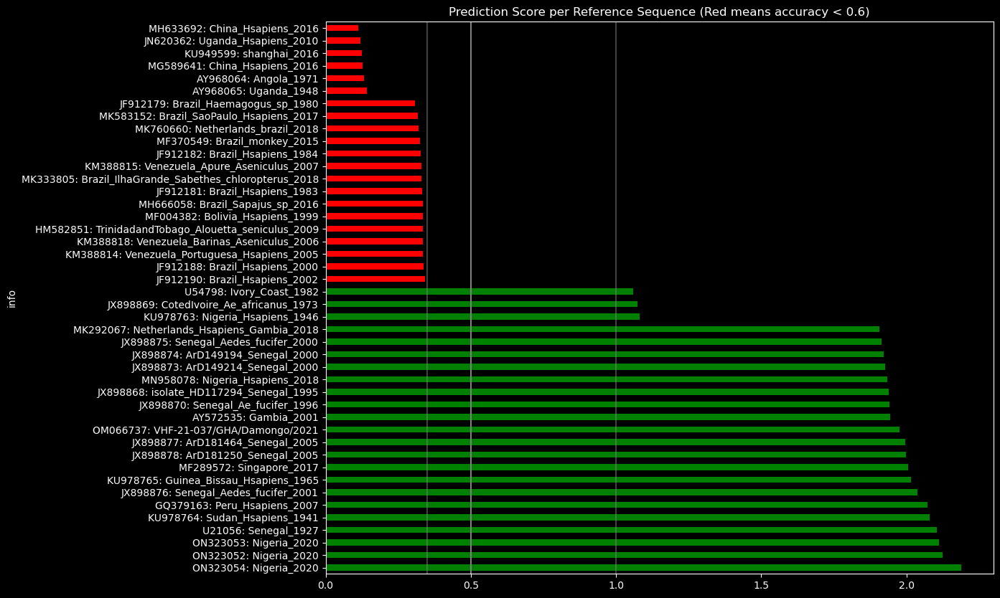

In [ ]:
grouped_by_refseq = df.groupby('refseqid').mean().loc[selected_refseqs,:].sort_values(by='preds_score', ascending=False)
grouped_by_refseq.index = df_refseqs.loc[grouped_by_refseq.index, 'info']
fig, ax = plt.subplots(figsize=(12, 10))
colors = ['red' if x < 0.6 else 'green' for x in grouped_by_refseq['accuracy']]
grouped_by_refseq['preds_score'].plot(ax=ax,kind='barh', color=colors)
ax.set_title('Prediction Score per Reference Sequence (Red means accuracy < 0.6)')
ax.vlines(x=0.35, ymin=-1, ymax=len(grouped_by_refseq), color='gray', linestyles='solid', alpha=0.5);
ax.vlines(x=0.5, ymin=-1, ymax=len(grouped_by_refseq), color='gray', linestyles='solid');
ax.vlines(x=1.0, ymin=-1, ymax=len(grouped_by_refseq), color='gray', linestyles='solid', alpha=0.5);

pred_score critical value at reference sequence level is somewhere between 0.35 and 1.0

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_by_posbin = grouped_by_posbin.loc[df.accuracy<0.6, :].groupby(['refseqid','bin']).mean().sort_values(by='preds_score', ascending=False)
grouped_by_posbin.loc[('11089:ncbi:1', slice(None)),:].sample(5)

accuracy  lbl_true  lbl_pred  pos_true  pos_pred  \
refseqid     bin                                                      
11089:ncbi:1 4339       0.0     118.0       6.0    4339.0       8.0   
             7626       0.0     118.0      32.0    7626.0       4.0   
             8499       0.0     118.0     140.5    8499.0       8.0   
             1355       0.0     118.0     146.0    1355.0       8.0   
             2501       0.0     118.0      17.0    2501.0       2.0   

                   preds_score  probs_score  top_5_lbl_pred_0  \
refseqid     bin                                                
11089:ncbi:1 4339     0.041051     0.028388               6.0   
             7626     0.000000     0.000611              32.0   
             8499     0.181768     0.081779             133.5   
             1355     0.067678     0.038540             146.0   
             2501     0.134616     0.049993              74.5   

                   top_5_lbl_pred_1  top_5_lbl_pred_2  top_5_lbl_pred_3  \
refseqid     bin                                                          
11089:ncbi:1 4339             137.0              62.0              97.0   
             7626              44.0              20.0               6.0   
             8499             144.0             133.5              61.0   
             1355              62.0              20.0             103.0   
             2501               6.0              83.0              35.0   

                   top_5_lbl_pred_4  
refseqid     bin                     
11089:ncbi:1 4339              74.0  
             7626             160.0  
             8499              29.0  
             1355              44.0  
             2501               8.0

In [ ]:
sorted(np.unique(np.array([b for a,b in grouped_by_posbin.index if b%500 == 0])))

[0, 500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000, 5500, 6000, 6500, 7000, 7500, 8000, 8500, 9000, 9500, 10000]

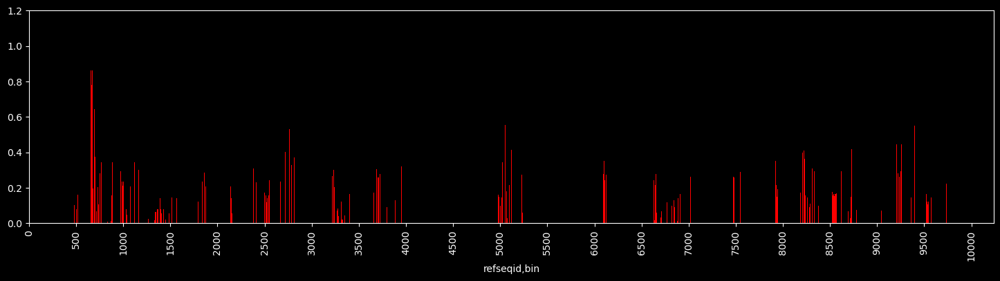

In [ ]:
refseqid = '11089:ncbi:30'

grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.loc[df.accuracy<0.6, :].groupby(['refseqid','bin']).mean().sort_values(by='preds_score', ascending=False)
if refseqid in [seqid for seqid, binid in grouped_low_acc.index]:
    g = grouped_low_acc.loc[(refseqid, slice(None)), :].sort_index()
    full_index = [(refseqid, i) for i in range(nb_bins)]
    g = g.reindex(full_index, fill_value=np.nan)

    fig,ax = plt.subplots(figsize=(18, 4))
    colors = ['red' if x < 0.6 else 'green' for x in g['accuracy']]
    g.preds_score.plot(ax=ax, kind='bar', width=1, color=colors)
    ticks = sorted(np.unique(np.array([b for a,b in grouped_low_acc.index if b%500 == 0])))
    ax.set_xticks(ticks, ticks)
    ax.set_ylim(0,1.2)
    plt.show()

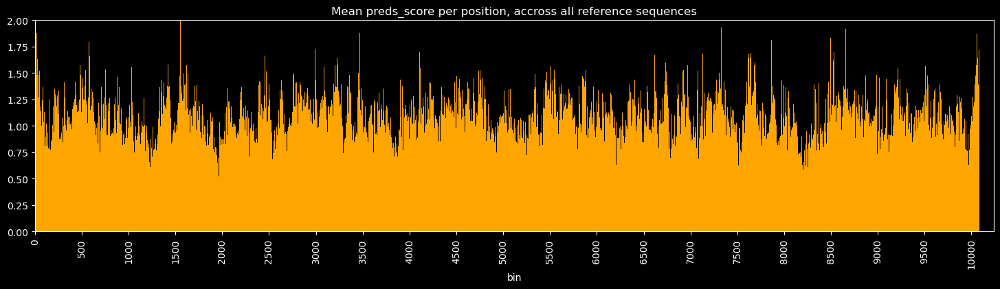

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.groupby(['bin']).mean().sort_values(by='preds_score', ascending=False)
full_index = range(nb_bins)
g = grouped_low_acc.reindex(full_index, fill_value=np.nan)

fig,ax = plt.subplots(figsize=(18, 4))
g.preds_score.plot(ax=ax, kind='bar', width=1, color='orange')
ax.set_title('Mean preds_score per position, accross all reference sequences')
ticks = np.unique(np.array([b for b in g.index if b%500 == 0]))
ax.set_xticks(ticks, ticks)
ax.set_ylim(0,2)
plt.show()

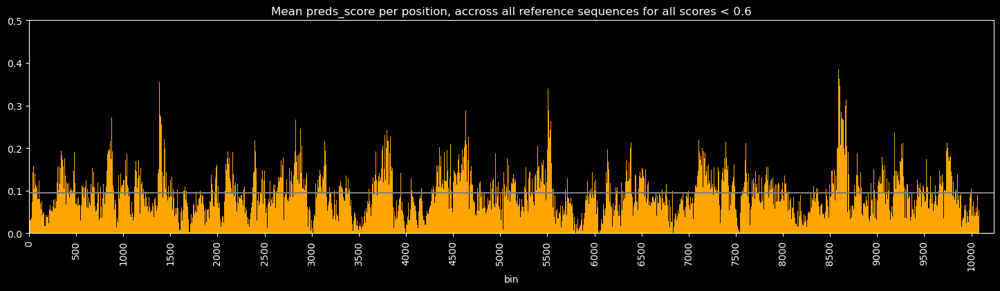

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.loc[df.accuracy<0.6, :].groupby(['bin']).mean().sort_values(by='preds_score', ascending=False)
full_index = range(nb_bins)
g = grouped_low_acc.reindex(full_index, fill_value=np.nan)

fig,ax = plt.subplots(figsize=(18, 4))
g.preds_score.plot(ax=ax, kind='bar', width=1, color='orange')
ax.hlines(y=g.preds_score.mean(), xmin=0, xmax=nb_bins, color='gray', linestyles='solid')
ax.set_title('Mean preds_score per position, accross all reference sequences for all scores < 0.6')
ticks = np.unique(np.array([b for b in g.index if b%500 == 0]))
ax.set_xticks(ticks, ticks)
ax.set_ylim(0,0.5)
plt.show()

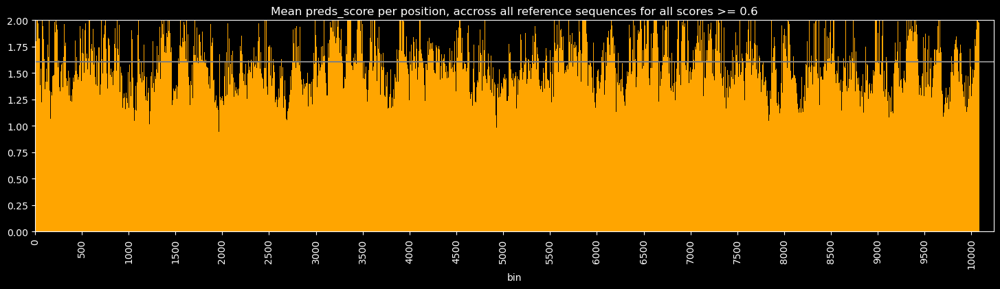

In [ ]:
grouped_by_posbin = df.loc[df.refseqid.isin(selected_refseqs), :]
grouped_low_acc = grouped_by_posbin.loc[df.accuracy>=0.6, :].groupby(['bin']).mean().sort_values(by='preds_score', ascending=False)
full_index = range(nb_bins)
g = grouped_low_acc.reindex(full_index, fill_value=np.nan)

fig,ax = plt.subplots(figsize=(18, 4))
g.preds_score.plot(ax=ax, kind='bar', width=1, color='orange')
ax.hlines(y=g.preds_score.mean(), xmin=0, xmax=nb_bins, color='gray', linestyles='solid')
ax.set_title('Mean preds_score per position, accross all reference sequences for all scores >= 0.6')
ticks = np.unique(np.array([b for b in g.index if b%500 == 0]))
ax.set_xticks(ticks, ticks)
ax.set_ylim(0,2)
plt.show()

# End of Section